# ***MOBILE HEALTH HUMAN BEHAVIOR***

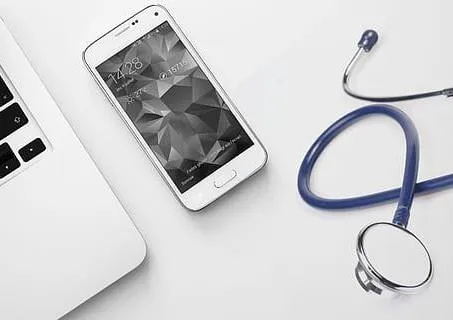

#NAME: THESLEENA.P







# TABLE CONTENTS:

1.   Problem Statement

1.   Objective

1.   Data Description

1.   Data Collection

1.   EDA

1.   Data Preprocessing

1.   Visualization
2.   Feature Engineering


9.   Data Splitting


10.   Feature Selection


11.   Data Scaling


12.   Model Training and Evaluation


13.   Hyperparameter Tuning


14.   Saving the model



15.   Pipeline

16.   Save the pipeline
17.   Conclusion


## PROBLEM STATEMENT

Mobile health human behavior,is a term that describes the fastly developing field of digital health providing care and treatment for the population via mobile technology such as smart devices.Human behavior is diverse and complex,this nature has posed a great challenge on learning,and most importantly,predicting the human behavior from daily activities.



## OBJECTIVES



*   Derivation of data-driven insights from a mobile health human behavior data by means of appropriate visuals.
*   Building and training a machine learning model that enables the prediction of human behavior by the means of a mobile health device.



## DATASET DESCRIPTION



*   Activities: 12
*   Sensor devices: 2


*   Subjects: 10






The collected dataset comprises  body motion and vital signs recordings for persons of diverse profile while performing 12 physical activities.The collected dataset comprises body motion and vital signs recordings for ten volunteers of diverse profile while performing 12 physical activities . Our volunteers' wearable sensors were used for the recordings. The sensors were respectively placed on the subject's right wrist and left ankle and attached by using elastic straps. The use of multiple sensors permits us to measure the motion experienced by diverse body parts, namely, the acceleration, thus better capturing the body dynamics. Each session was recorded using a video camera. This dataset is found to generalize to common activities of the daily living, given the diversity of body parts involved in each one (e.g., frontal elevation of arms vs. knees bending), the intensity of the actions (e.g., cycling vs. sitting and relaxing) and their execution speed or dynamicity (e.g., running vs. standing still). The activities were collected in an out-of-lab environment with no constraints on the way these must be executed, with the exception that the subject should try their best when executing them.



## *****   ** Features Information    *******


---


1.   alx: acceleration from the left-ankle sensor (X axis)

2.   aly: acceleration from the left-ankle sensor (Y axis)


3.   alz: acceleration from the left-ankle sensor (Z axis)

2.   glx: gyro from the left-ankle sensor (X axis)


5.   gly: gyro from the left-ankle sensor (Y axis)

2.   glz: gyro from the left-ankle sensor (Z axis)


7.   arx: acceleration from the right-lower-arm sensor (X axis)

2.   ary: acceleration from the right-lower-arm sensor (Y axis)


9.   arz: acceleration from the right-lower-arm sensor (Z axis)

2.   grx: gyro from the right-lower-arm sensor (X axis)


11.   gry: gyro from the right-lower-arm sensor (Y axis)

2.   grz: gyro from the right-lower-arm sensor (Z axis)


13.   subject: volunteer number

# ******.   Target Information:*****

---




14.   Activity: corresponding activity






















### ACTIVITY SET

The activity set is listed in the following:



Activity set
1.   L1: Standing still (1 min)
1.   L2: Sitting and relaxing (1 min)

1.   L3: Lying down (1 min)
2.   L4: Walking (1 min)


5.   L5: Climbing stairs (1 min)



6.   L6: Waist bends forward (20x)


7.   L7: Frontal elevation of arms (20x)



8.   L8: Knees bending (crouching) (20x)


9.   L9: Cycling (1 min)



10.   L10: Jogging (1 min)

11.   L11: Running (1 min)





12.   L12: Jump front & back (20x)

 NOTE: In brackets are the number of repetitions (Nx) or the duration of the exercises (min)







# DATA COLLECTION

Preprocessing is cleaning and preparing data is critical in machine learning.Working with big datasets in python requires attention and effort.If not done right,it may result in flawed models and bad predictions.

In [ ]:
# importing required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB

The ML projects,the right tools and libraries are crucial.They greatly improve our work and the outcomes of our projects.We use python's powerful libraries like Pandas and NumPy for cleaning and fixing our data.

*   sklearn:

---
sklearn is a top Python library for machine learning.It offers many algorithms for tasks like classification and clustering.It's easy to use and has lots of documentation.This makes sklearn great for testing different machine learning models.




*   NumPy:

---
NumPy is key for scientific computing in python.It helps with efficient numerical operations and handling large data.Other ML libraries often use Numpy,making it important for our workflow.

*   Pandas:

---
Pandas is great for data manipulation and analysis.It makes it easy to clean,transform,and explore data.With tools for handling missing data and merging datasets,pandas is crucial for machine learning.

*   Matplotlib:

---
Matplotlib let us create many visualizations.We can make line plots,scatter plots and more.Matplotlib is a widely used Python library for creating static, interactive, and animated visualizations in Python. It provides a wide range of tools for producing plots and charts, from simple line graphs to complex 3D visualizations. The most commonly used module in Matplotlib is pyplot, which provides an interface for creating visualizations similar to MATLAB.



  






1.Load the dataset

In [ ]:
# Load the dataset
df = pd.read_csv("mhealth_raw_data.csv")
df

,alx,aly,alz,glx,gly,glz,arx,ary,arz,grx,gry,grz,Activity,subject
0,2.18490,-9.6967,0.63077,0.103900,-0.84053,-0.68762,-8.6499,-4.5781,0.187760,-0.449020,-1.01030,0.034483,0,subject1
1,2.38760,-9.5080,0.68389,0.085343,-0.83865,-0.68369,-8.6275,-4.3198,0.023595,-0.449020,-1.01030,0.034483,0,subject1
2,2.40860,-9.5674,0.68113,0.085343,-0.83865,-0.68369,-8.5055,-4.2772,0.275720,-0.449020,-1.01030,0.034483,0,subject1
3,2.18140,-9.4301,0.55031,0.085343,-0.83865,-0.68369,-8.6279,-4.3163,0.367520,-0.456860,-1.00820,0.025862,0,subject1
4,2.41730,-9.3889,0.71098,0.085343,-0.83865,-0.68369,-8.7008,-4.1459,0.407290,-0.456860,-1.00820,0.025862,0,subject1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048570,0.32374,-9.9511,-1.04640,-0.569570,-0.75422,-0.52456,-6.5886,-10.5290,2.129800,-0.182350,-0.92813,-0.553880,0,subject9
1048571,0.40570,-10.0510,-1.11310,-0.569570,-0.75422,-0.52456,-6.0806,-10.5710,1.877700,-0.182350,-0.92813,-0.553880,0,subject9
1048572,0.48707,-10.0110,-1.09980,-0.593690,-0.75047,-0.53045,-5.3752,-10.0910,1.870400,-0.078431,-0.96509,-0.560340,0,subject9
1048573,0.41283,-9.8038,-1.17360,-0.593690,-0.75047,-0.53045,-4.6322,-9.7003,1.973300,-0.078431,-0.96509,-0.560340,0,subject9


 Now,We load the dataset with the read_csv method using Pandas.It converts into dataframe.A DataFrame is a data structure made up of rows and columns.

## DATA PREPROCESSING:

2.Understand the data structure

In [ ]:
df.shape

(1048575, 14)

The df.shape method provides information about the number of rows and columns ina DataFrame quickly.Here,we got 1048575 rows and 14 columns.

In [ ]:
df.head()

,alx,aly,alz,glx,gly,glz,arx,ary,arz,grx,gry,grz,Activity,subject
0,2.1849,-9.6967,0.63077,0.103900,-0.84053,-0.68762,-8.6499,-4.5781,0.187760,-0.44902,-1.0103,0.034483,0,subject1
1,2.3876,-9.5080,0.68389,0.085343,-0.83865,-0.68369,-8.6275,-4.3198,0.023595,-0.44902,-1.0103,0.034483,0,subject1
2,2.4086,-9.5674,0.68113,0.085343,-0.83865,-0.68369,-8.5055,-4.2772,0.275720,-0.44902,-1.0103,0.034483,0,subject1
3,2.1814,-9.4301,0.55031,0.085343,-0.83865,-0.68369,-8.6279,-4.3163,0.367520,-0.45686,-1.0082,0.025862,0,subject1
4,2.4173,-9.3889,0.71098,0.085343,-0.83865,-0.68369,-8.7008,-4.1459,0.407290,-0.45686,-1.0082,0.025862,0,subject1


The df.head() function in Python, specifically in the pandas library, is used to display the first few rows of a DataFrame (df). By default, it shows the first five rows, but you can specify a different number by passing an integer as an argument, like df.head(10) to see the first ten rows.
It provides a quick glance at the data structure, including column names and data types.
Useful for checking the integrity and format of your data right after loading it.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 14 columns):
 #   Column    Non-Null Count    Dtype  
---  ------    --------------    -----  
 0   alx       1048575 non-null  float64
 1   aly       1048575 non-null  float64
 2   alz       1048575 non-null  float64
 3   glx       1048575 non-null  float64
 4   gly       1048575 non-null  float64
 5   glz       1048575 non-null  float64
 6   arx       1048575 non-null  float64
 7   ary       1048575 non-null  float64
 8   arz       1048575 non-null  float64
 9   grx       1048575 non-null  float64
 10  gry       1048575 non-null  float64
 11  grz       1048575 non-null  float64
 12  Activity  1048575 non-null  int64  
 13  subject   1048575 non-null  object 
dtypes: float64(12), int64(1), object(1)
memory usage: 112.0+ MB


The df.info() function in pandas provides a concise summary of a DataFrame (df). It gives you important information about the structure and content of the DataFrame.
Overview of DataFrame: It summarizes the DataFrame, helping you understand its shape, data types, and memory usage.
Data Types: Displays the data type of each column, which is crucial for understanding how the data is stored and manipulated.
Missing Values: Indicates the number of non-null entries in each column, helping identify missing data.
Key Components of the Output:

*   Index Range: Shows the range of the index (e.g., RangeIndex: 0 to 4).


*   Column Information: Lists each column with its name, data type, and number of non-null entries.

*   Dtype Summary: Provides a summary of the data types in the DataFrame (e.g., int64, float64, object).



*   Memory Usage: Indicates the amount of memory used by the DataFrame.




In [ ]:
df.describe()

,alx,aly,alz,glx,gly,glz,arx,ary,arz,grx,gry,grz,Activity
count,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06
mean,1.481221e+00,-9.574932e+00,-8.791344e-01,-1.007315e-02,-6.135945e-01,-1.376290e-01,-3.551709e+00,-5.707373e+00,2.654840e+00,-2.750808e-01,-4.556301e-01,2.882224e-01,1.732673e+00
std,3.690661e+00,4.071565e+00,5.303325e+00,4.942075e-01,3.568763e-01,5.452972e-01,4.711360e+00,5.726784e+00,3.879341e+00,5.349013e-01,5.647479e-01,5.556644e-01,3.251485e+00
min,-2.214600e+01,-1.961900e+01,-1.937300e+01,-2.146600e+00,-7.789900e+00,-2.567800e+00,-2.236100e+01,-1.897200e+01,-1.823900e+01,-8.339200e+00,-3.570800e+00,-2.689700e+00,0.000000e+00
25%,1.691250e-01,-1.008400e+01,-2.599400e+00,-4.471200e-01,-8.123800e-01,-5.677800e-01,-5.890450e+00,-9.364650e+00,4.175400e-01,-7.058800e-01,-8.932200e-01,-1.961200e-01,0.000000e+00
50%,1.342900e+00,-9.647600e+00,1.909100e-02,-2.968500e-02,-7.035600e-01,-1.493100e-01,-2.870500e+00,-7.380000e+00,2.218300e+00,-3.568600e-01,-6.262800e-01,3.254300e-01,0.000000e+00
75%,2.568100e+00,-9.014300e+00,1.372500e+00,4.415600e-01,-5.422100e-01,3.418500e-01,-1.030400e+00,-2.450350e+00,5.257650e+00,9.607800e-02,-8.008200e-02,7.887900e-01,2.000000e+00
max,2.005400e+01,2.116100e+01,2.501500e+01,6.048400e+01,2.011300e+00,2.770100e+00,1.986400e+01,2.219100e+01,2.574100e+01,3.319600e+00,1.556500e+00,2.750000e+00,1.200000e+01


It seems like we have a dataset with several columns representing sensor measurements (arx, ary, arz, grx, gry, grz) and a categorical column (Activity). The .describe() method has generated summary statistics for each numerical column in your dataset, with information on the count, mean, standard deviation, min, 25th percentile, 50th percentile (median), 75th percentile, and max values.

Count: All columns have 1,048,575 non-null entries, indicating no missing values in the dataset.
Mean: The mean values show the central tendency of each sensor's readings. For example, arx has a mean of approximately 1.48, while ary has a mean of about -9.57.
Standard Deviation (std): This indicates the variability in the data. For instance, grx has a standard deviation of approximately 4.94, suggesting considerable variability in that column.
Min: The minimum values show the lowest observed values in each column. For example, grx has a minimum of about -2.15, and Activity's minimum is 0, indicating a classification where 0 could be a certain activity type.
25%, 50%, 75%: These represent the quartiles of the data (25th, 50th, and 75th percentiles), which help show the distribution of values. For example:
arx has a median of 1.34 (50th percentile), and 75% of the values are below 2.57.
grx has a median of approximately 0.44 (50th percentile), with 75% of the values below 4.42.

Sensor Data (arx, ary, arz, grx, gry, grz):

These columns likely represent accelerometer and gyroscope data along different axes (x, y, z).
arx, ary, arz have negative mean values, indicating the sensors might be oriented in such a way that their readings tend to be negative.
grx, gry, grz have a wide range of values, with relatively large standard deviations, which indicates significant variation in the readings.
Some columns, like arx, have a maximum value (max) of around 20, and min values can be as low as -22, suggesting the readings can vary significantly.


Activity:

This column seems to be a categorical variable, and the values represent different types of activity. Based on the min, 25th percentile, and max values, it's likely that the Activity column contains discrete integers, with values ranging from 0 to 12 (the activities are likely labeled with these integers).


3.Handle missing values

In [ ]:
# missing values
df.isnull().sum()

,0
alx,0
aly,0
alz,0
glx,0
gly,0
glz,0
arx,0
ary,0
arz,0
grx,0


The code df.isnull().sum() in pandas checks for missing (null) values in each column of a DataFrame.It looks like the output from df.isnull().sum() indicates that there are no missing values in any of the columns in our dataset. Here's a quick breakdown of the result:

All the columns (alx, aly, alz, glx, gly, glz, arx, ary, arz, grx, gry, grz, Activity, subject) have 0 missing values (NaN), meaning every entry in our dataset is complete.
No missing data: we don't need to perform any
imputation or handle missing values, which is great because we can proceed directly with analysis, modeling, or other tasks.

4.Handle Duplicates

To remove duplicate rows from a DataFrame, you can use the df.duplicates() function. This function removes rows where all the values are identical (duplicate rows).



In [ ]:
# checking duplicates
df.duplicated().sum()

0

To removing duplicated rows from a pandas DataFrame where the duplicated rows are marked as 0.

 6.Handle Outliers

Outliers are data points that significantly differ from the rest of the data. These values can skew statistical analyses, create bias in machine learning models, or lead to incorrect conclusions. Outliers can be caused by errors in data collection, but they can also represent rare or important events (e.g., fraud detection, rare diseases).

There are several ways to detect outliers:



*   Boxplot
*   IQR method,Z_score method and percentile method

*   Histogram
*   Skewness

Boxplots are a graphical way to visualize the distribution of data and detect outliers. Outliers are typically any values that lie outside the "whiskers" of the boxplot (i.e., outside the range of
𝑄
1
−
1.5
×
𝐼
𝑄
𝑅
Q1−1.5×IQR and
𝑄
3
+
1.5
×
𝐼
𝑄
𝑅
Q3+1.5×IQR).



# Box plot

Boxplots are a graphical way to visualize the distribution of data and detect outliers. Outliers are typically any values that lie outside the "whiskers" of the boxplot (i.e., outside the range of 𝑄 1 − 1.5 × 𝐼 𝑄 𝑅 Q1−1.5×IQR and 𝑄 3 + 1.5 × 𝐼 𝑄 𝑅 Q3+1.5×IQR).





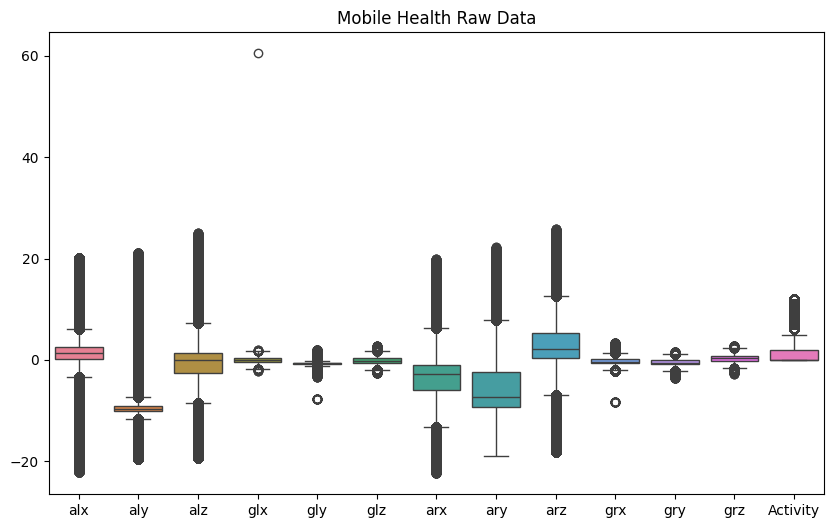

In [ ]:
# before remove the outlier

plt.figure(figsize=(10, 6))
sns.boxplot(df)
plt.title('Mobile Health Raw Data')
plt.show()


# IQR Method

We can see outliers in different columns.that can be removed  by using IQR method.the columns where outliers exist (values outside the whiskers).
Based on that, we can proceed with our method for handling outliers (e.g., Z-score, IQR, removal, capping, etc.)

In [ ]:
# Remove the outlier all columns by using functions of IQR method
def remove_outliers(df,columns):
    df_filtered = df.copy()

    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1

        lower_whisker = Q1 - 1.5 * IQR
        upper_whisker = Q3 + 1.5 * IQR

        df_filtered = df_filtered[(df_filtered[col] <= upper_whisker) & (df_filtered[col] >= lower_whisker)]
    return df_filtered

In [ ]:
# we can apply outlier columns
df1 = remove_outliers(df,['alx','aly','alz','glx','gly','glz','arx','ary','arz','grx','gry','grz'])


 The function for removing outliers using the IQR (Interquartile Range) method looks good overall! It follows the correct approach for identifying outliers based on the IQR and filtering out rows that contain outliers.

# Skewness

In [ ]:
# check the skewness of numerical columns
df1.skew(numeric_only=True)

,0
alx,-0.050069
aly,0.306123
alz,-1.007392
glx,0.163344
gly,0.827304
glz,-0.009673
arx,-0.280922
ary,1.095049
arz,0.291986
grx,0.349160


In [ ]:
df1.shape

(641855, 14)

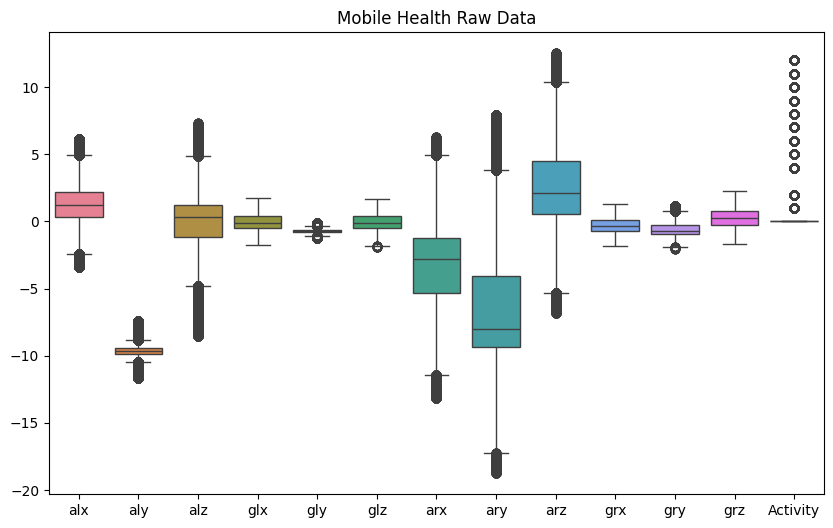

In [ ]:
# After removed the outliers

plt.figure(figsize=(10, 6))
sns.boxplot(df1)
plt.title('Mobile Health Raw Data')
plt.show()


# Histogram
Histograms with KDE are an excellent way to explore the distribution of your data visually before proceeding with any data transformations or outlier removal.


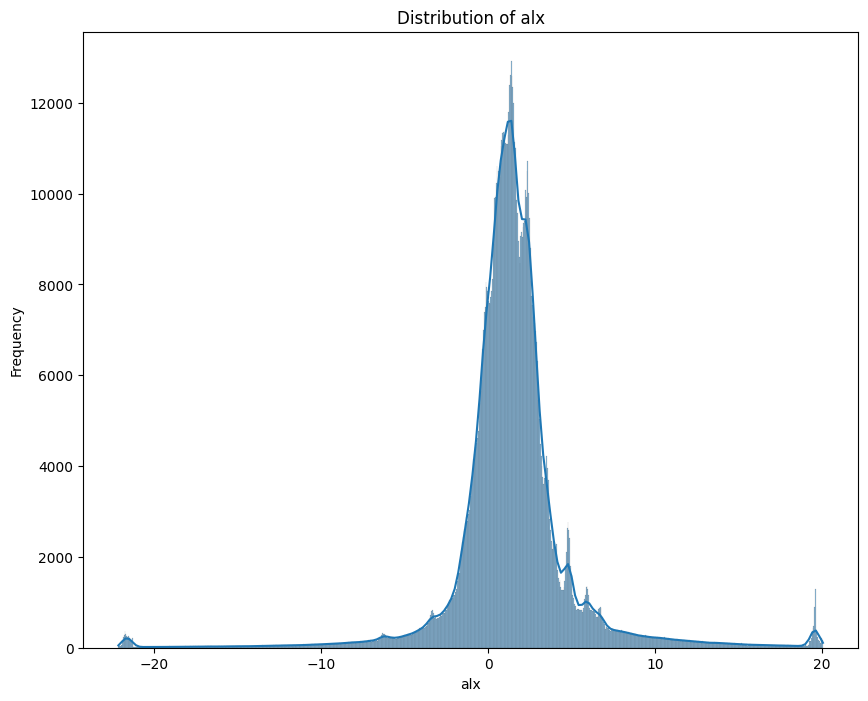

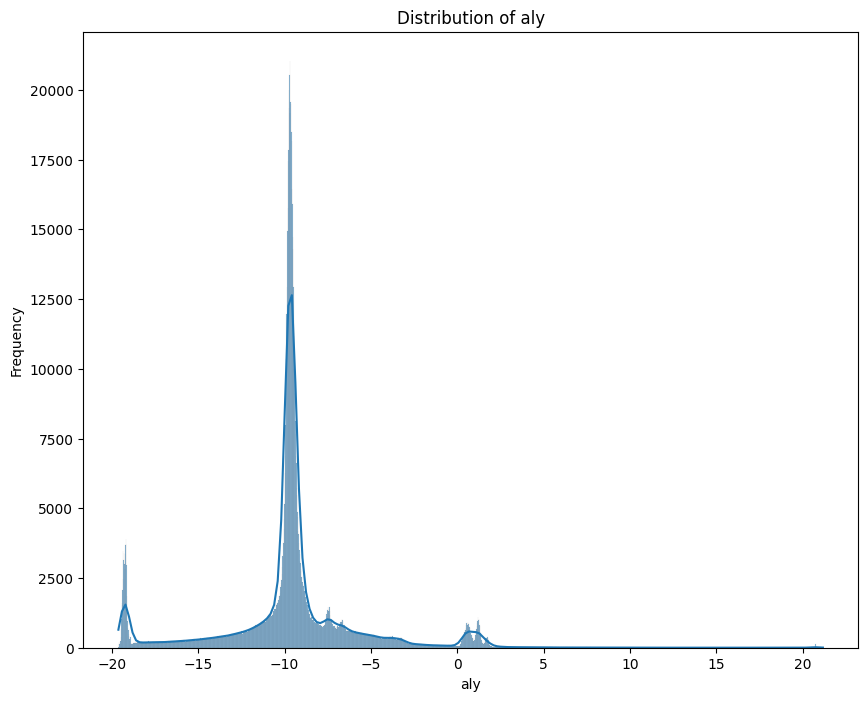

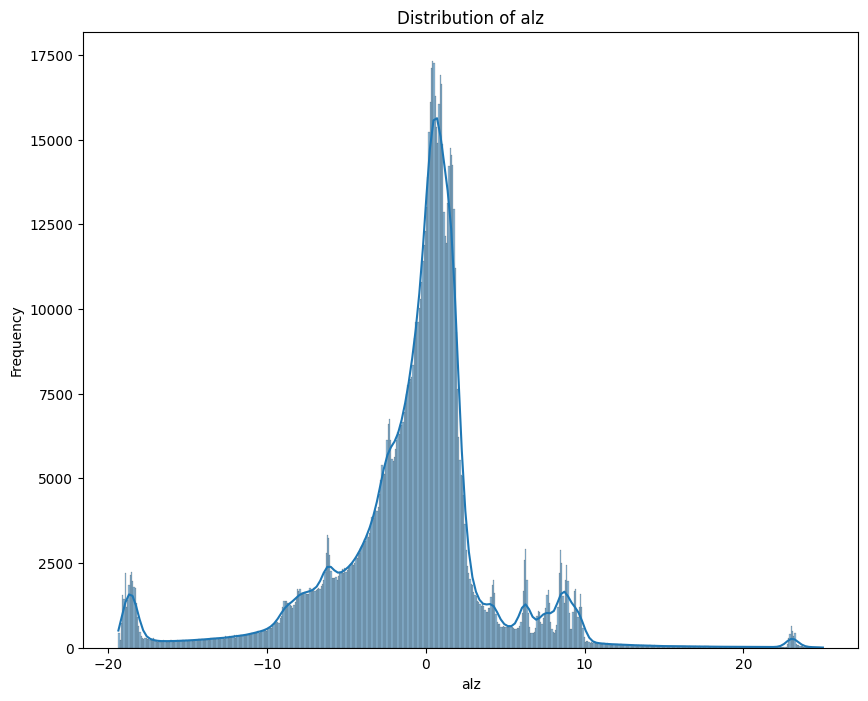

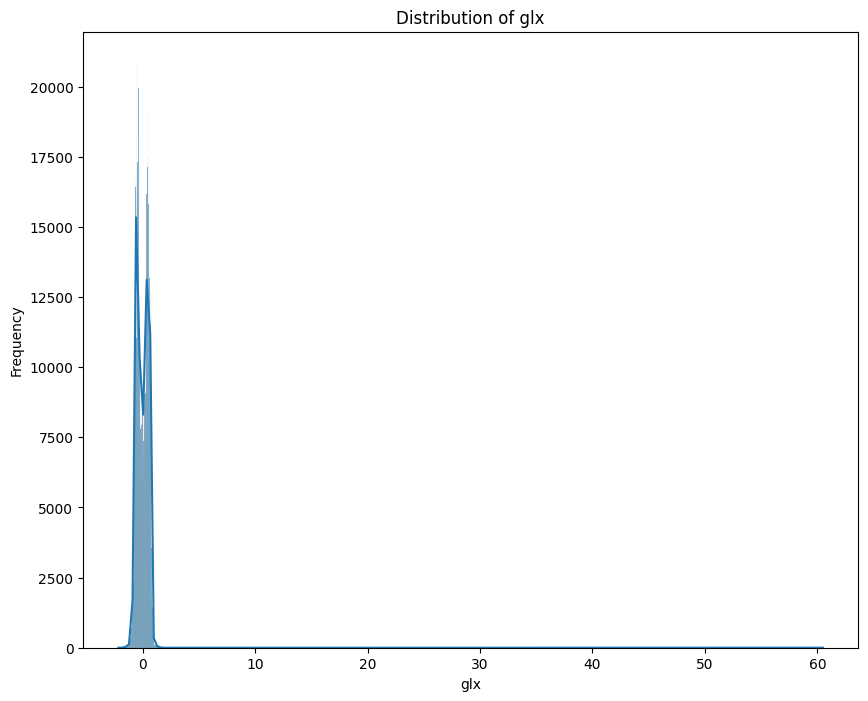

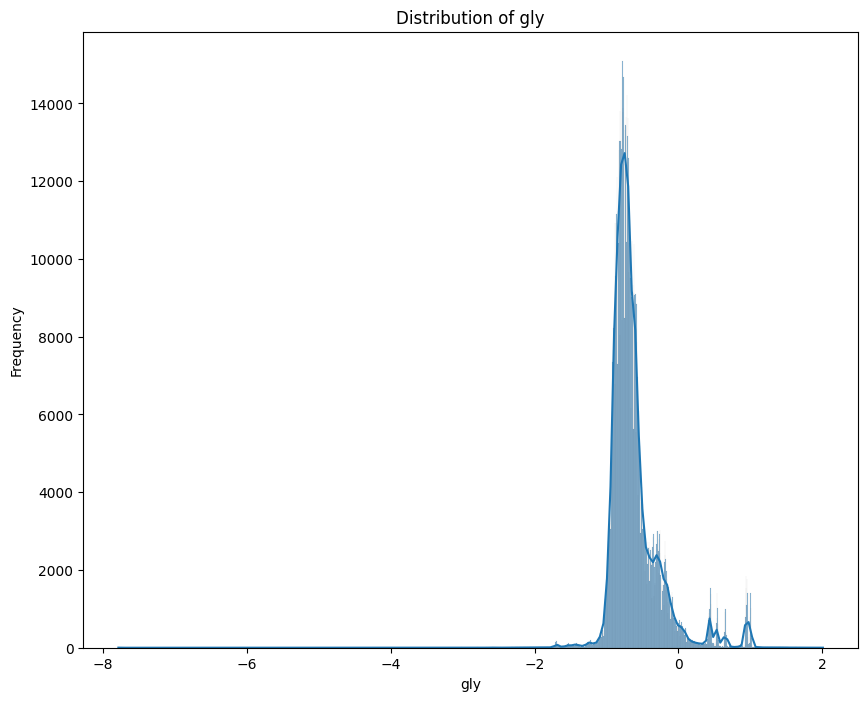

...

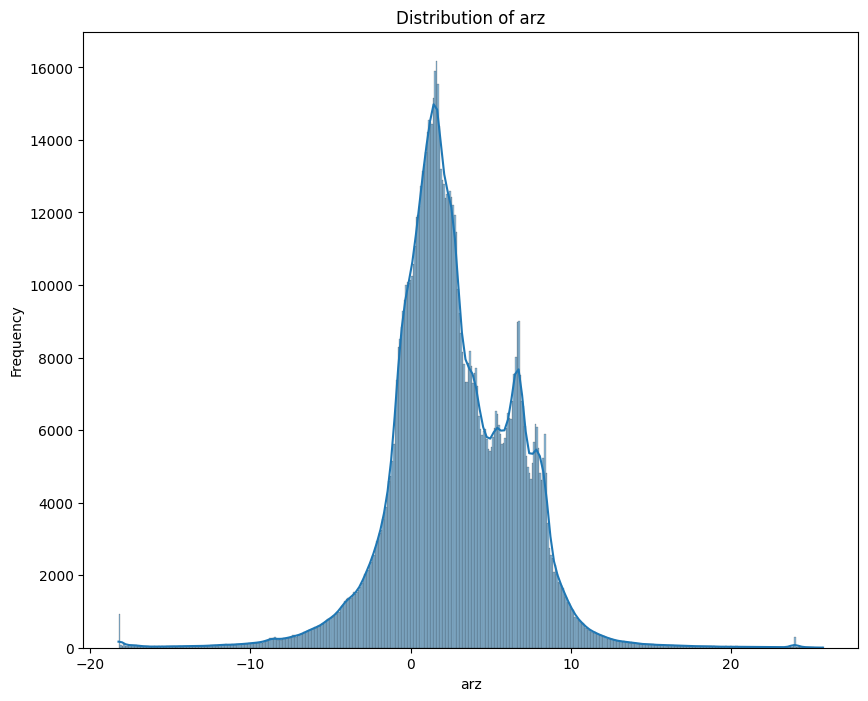

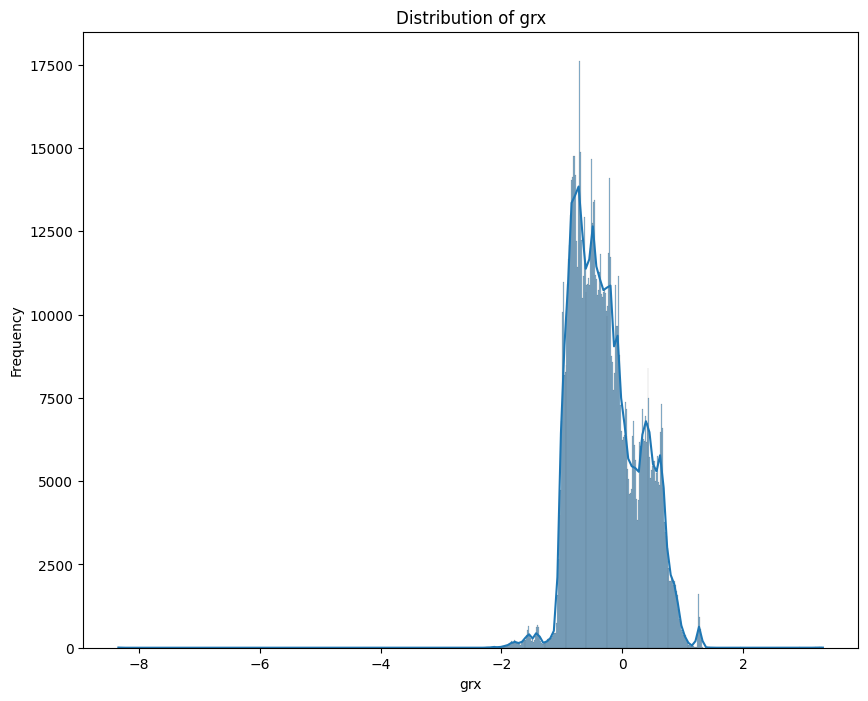

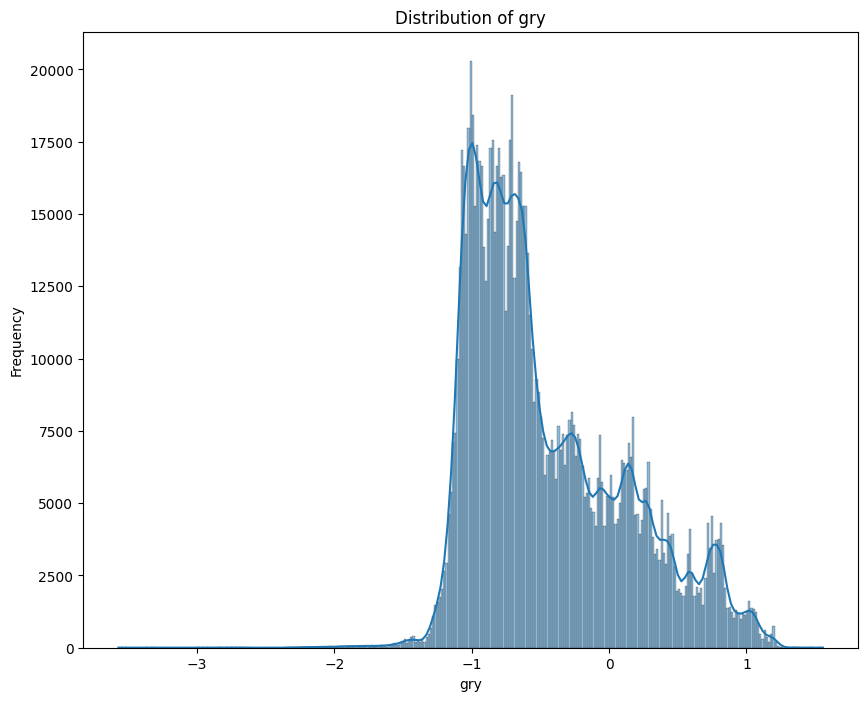

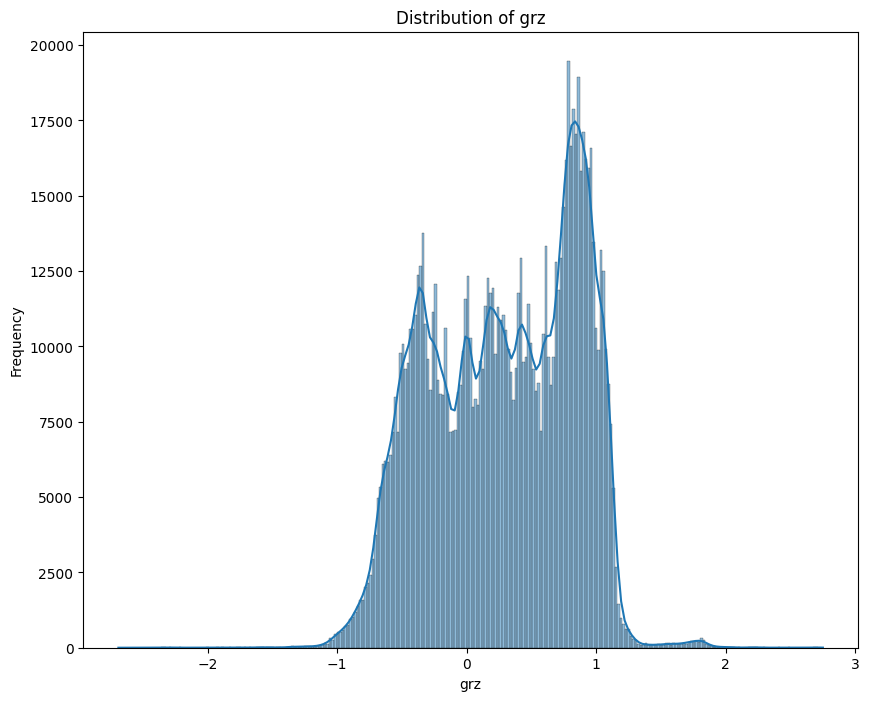

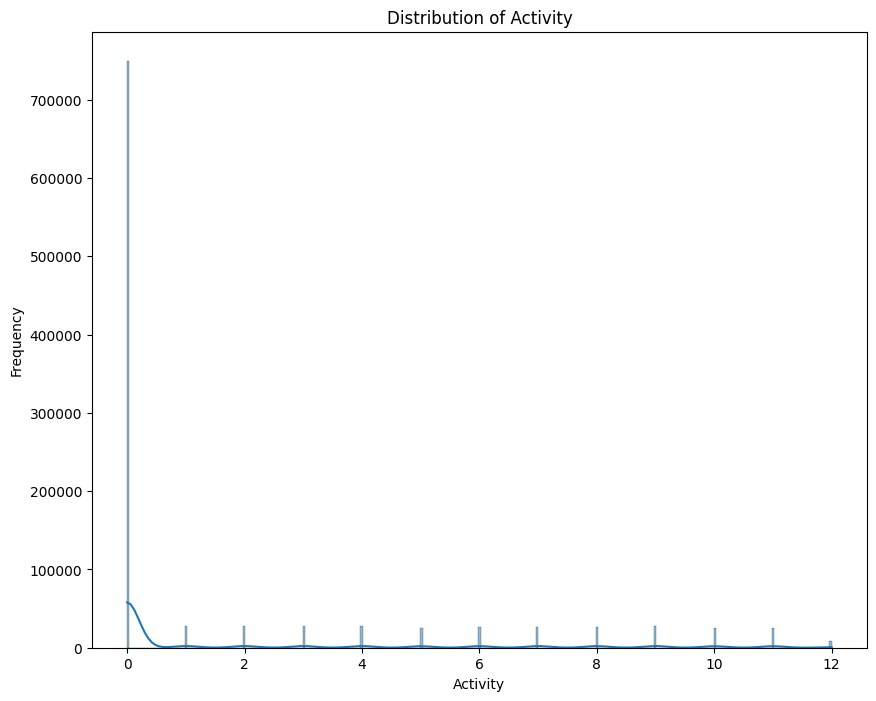

In [ ]:
# create a histplot for each numerical columns before remove the outliers
for column in df.select_dtypes(include=['float64', 'int64']).columns:
    plt.figure(figsize=(10, 8))
    sns.histplot(df[column], kde=True)
    plt.title('Distribution of ' + column)
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()


A distribution that is skewed to the right (positive skew) or left (negative skew) can indicate that there may be outliers, especially if there’s a long tail.If the histogram has multiple peaks, it could indicate the presence of different subgroups in the data or errors. Outliers might appear as bars far away from the rest of the data.


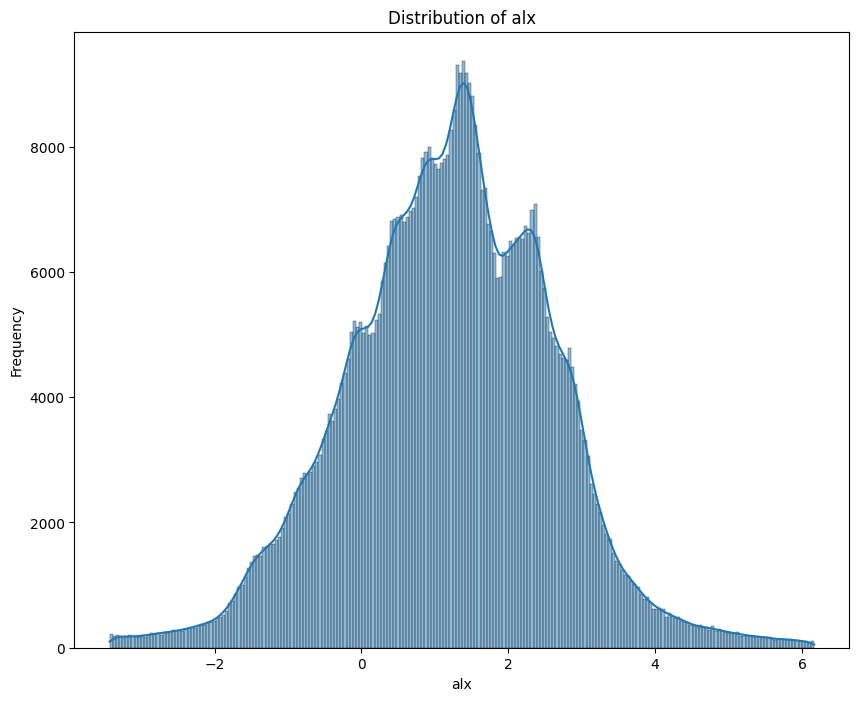

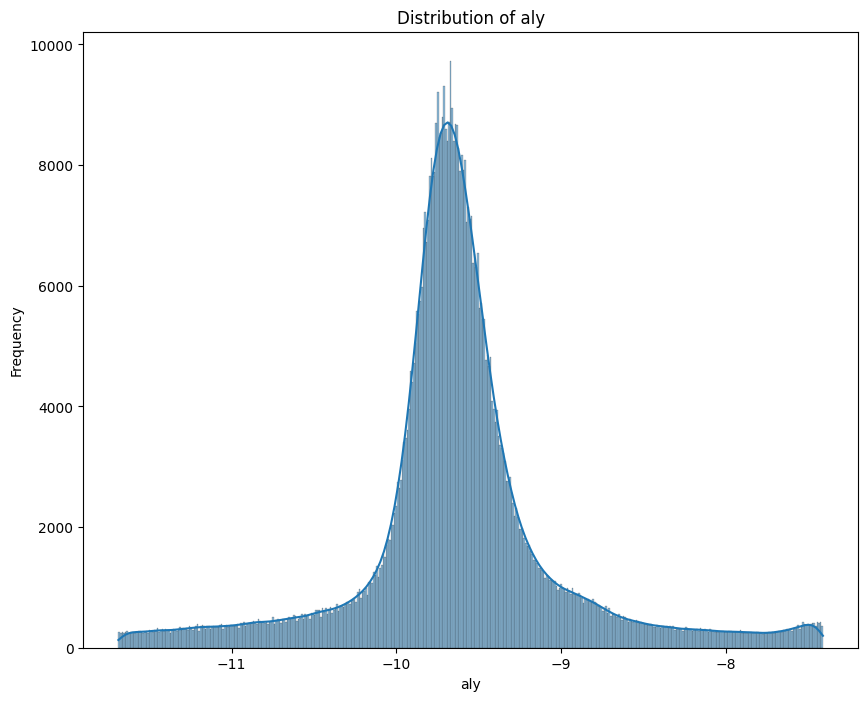

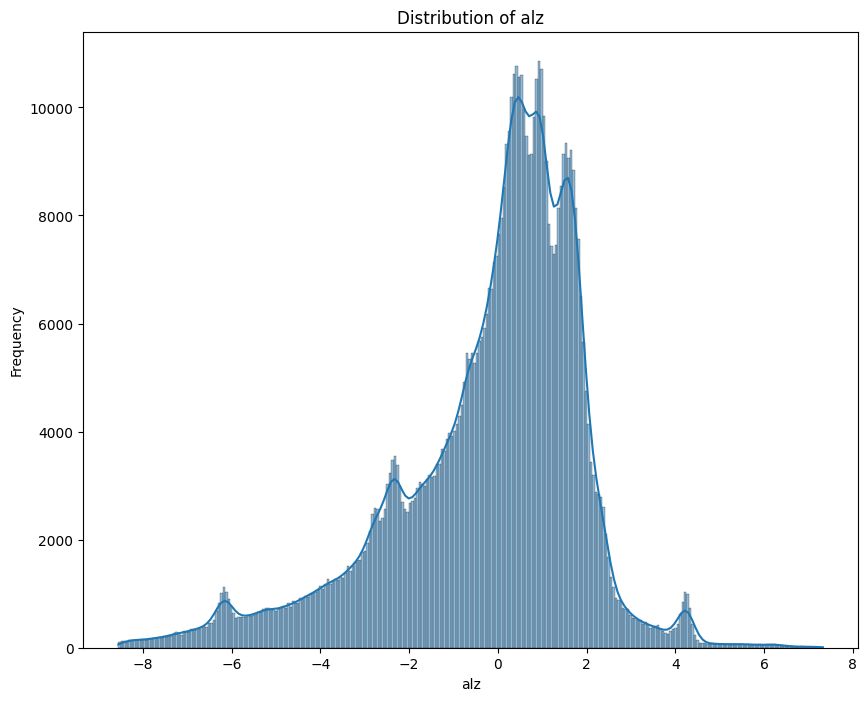

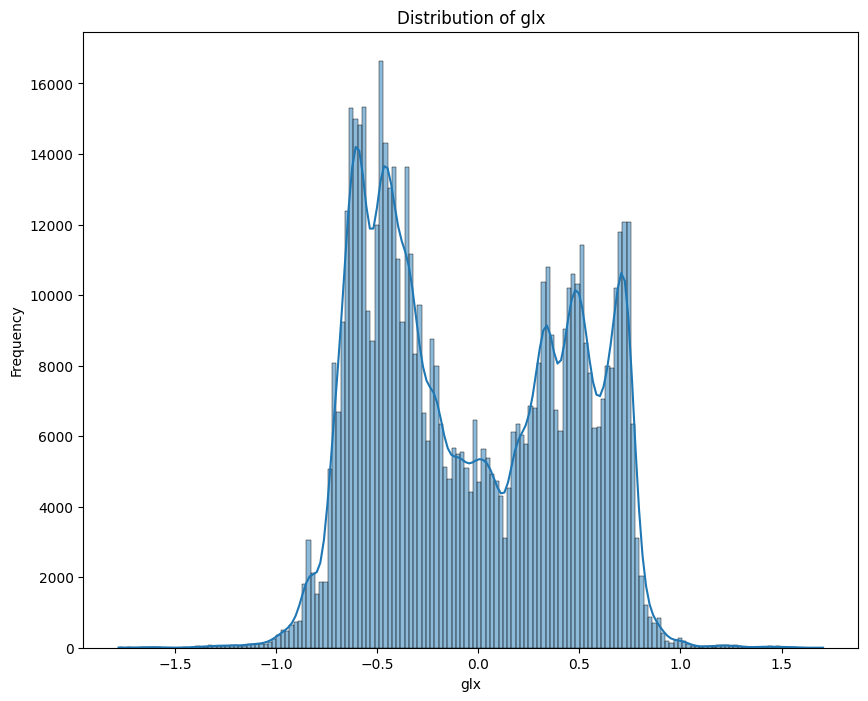

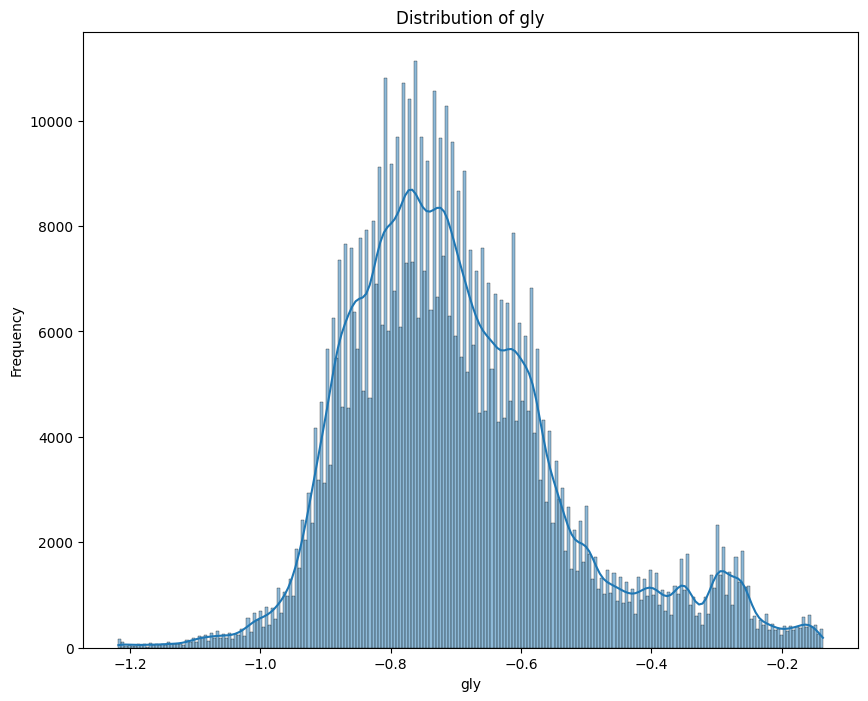

...

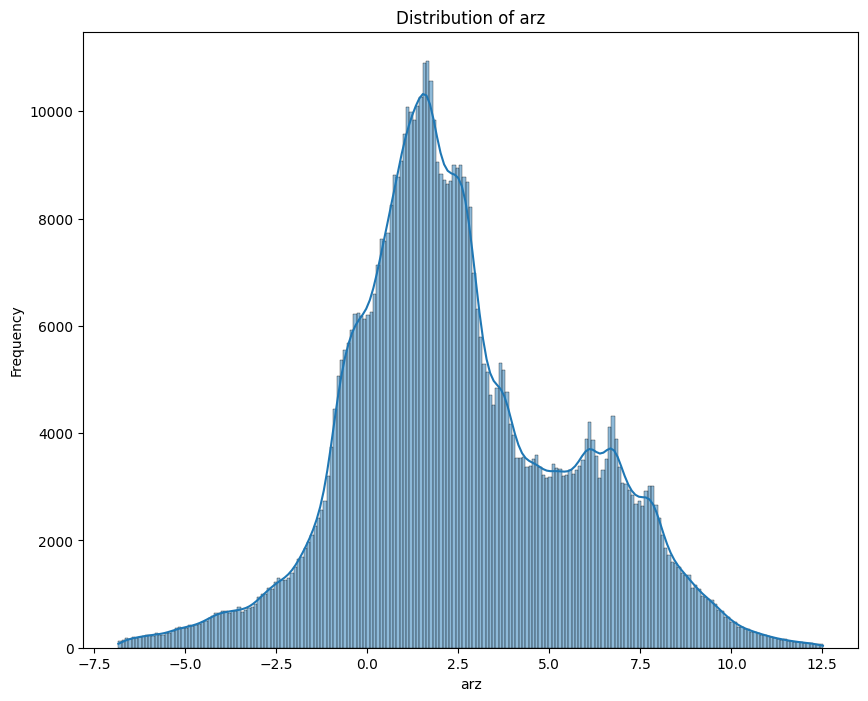

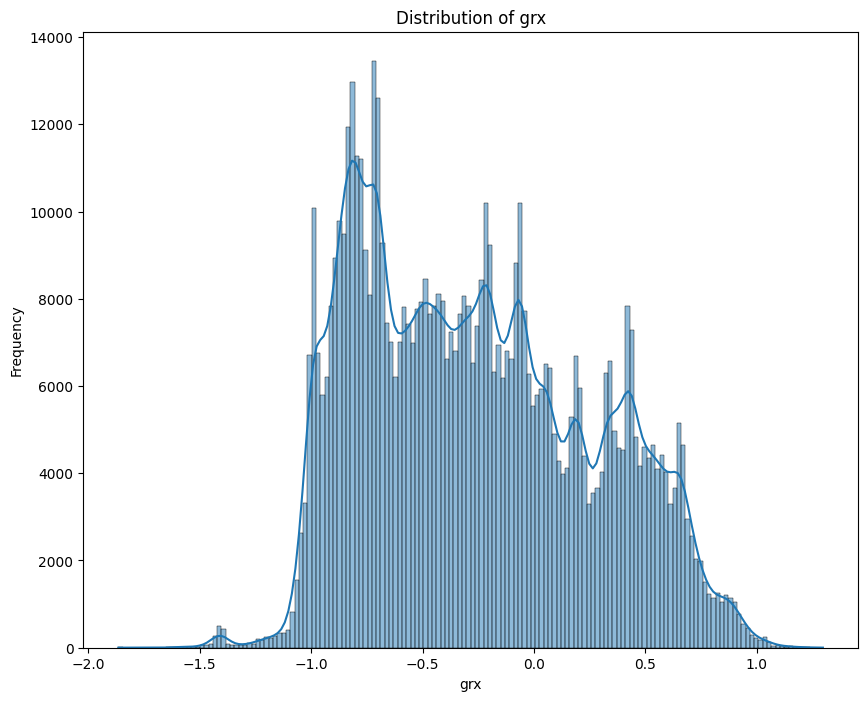

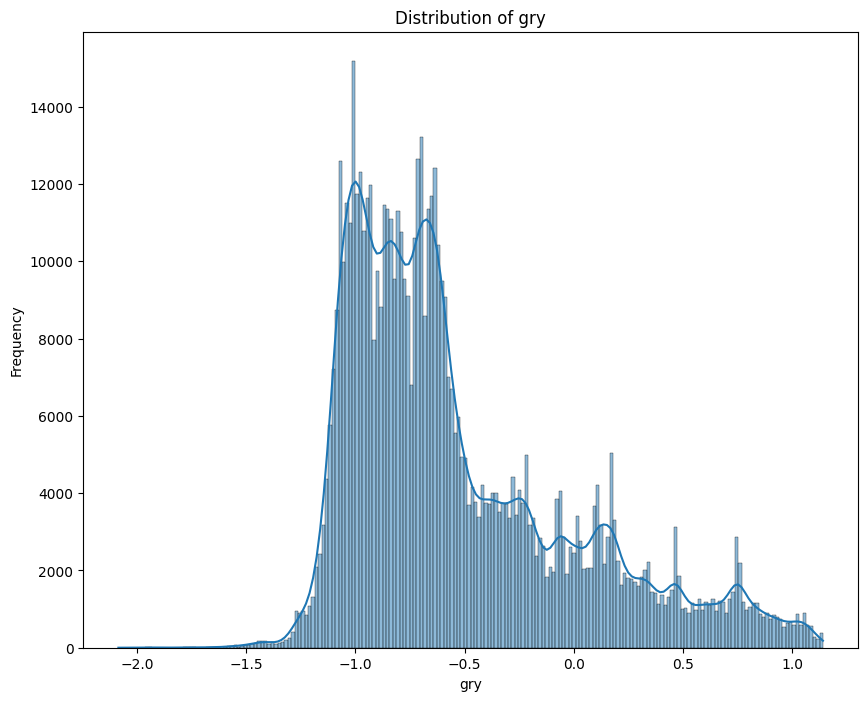

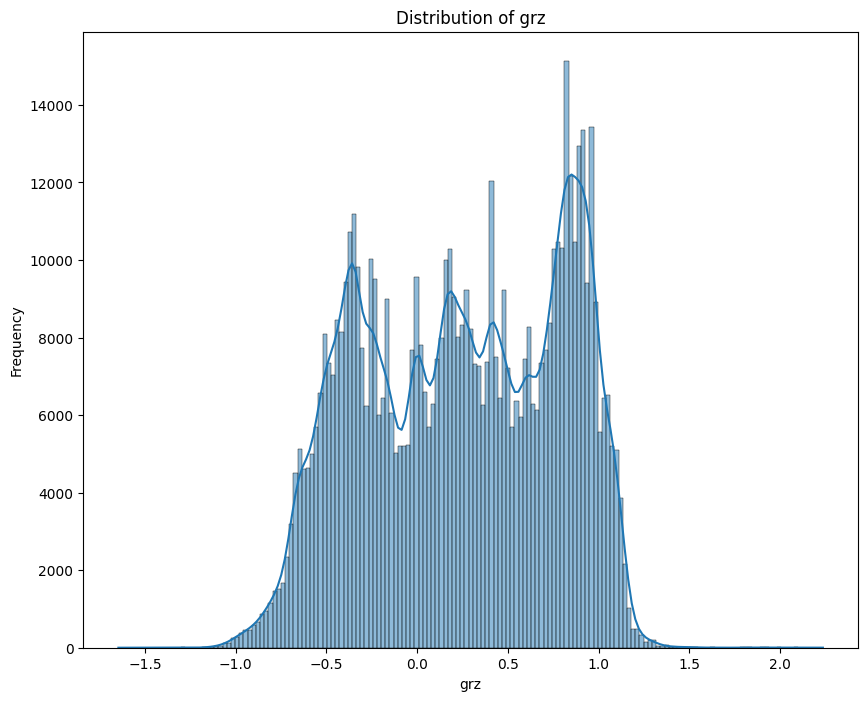

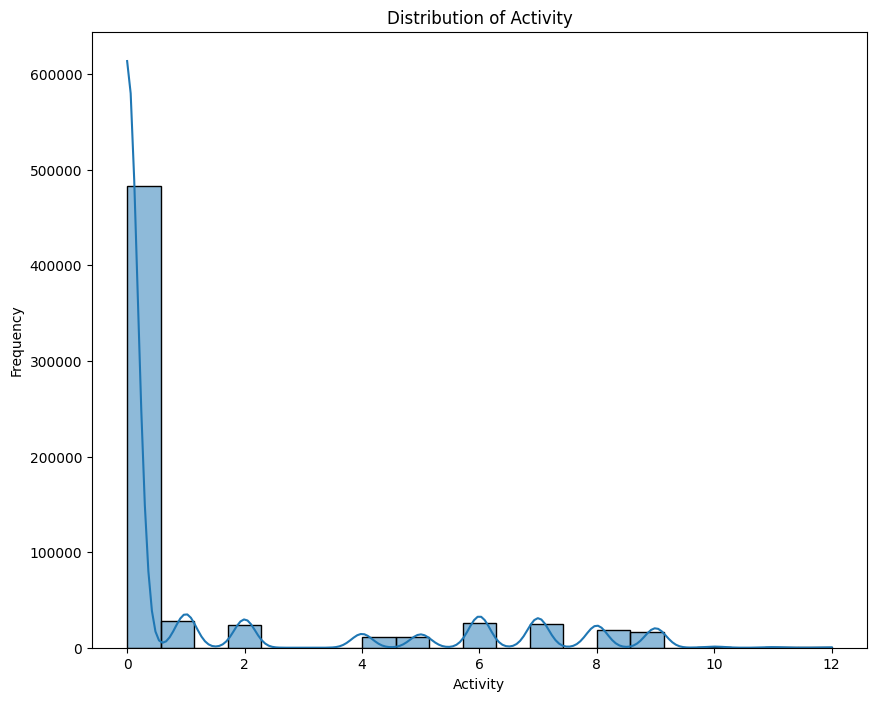

In [ ]:
# create a histplot for each columns after remove the outliers
for column in df.select_dtypes(include=['float64', 'int64']).columns:
    plt.figure(figsize=(10, 8))
    sns.histplot(df1[column], kde=True)
    plt.title('Distribution of ' + column)
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()


To plotting histograms (with KDE) of each column after removing the outliers looks almost perfect. However, the only thing to check is whether you're using the correct DataFrame (df1) after outlier removal. From the previous code you shared, I assume that df1 is the DataFrame with outliers removed, so make sure df1 is correctly defined and contains the filtered data.
df1 should contain our data after the outlier removal.
This will generate histograms for each numerical column, displaying the distribution of data after outliers have been removed.

In [ ]:
# checking skewness after removed outlier
df1.skew(numeric_only=True)

,0
alx,-0.050069
aly,0.306123
alz,-1.007392
glx,0.163344
gly,0.827304
glz,-0.009673
arx,-0.280922
ary,1.095049
arz,0.291986
grx,0.349160


In [ ]:
df1.shape

(641855, 14)

# Visualization

# Bar plot

---



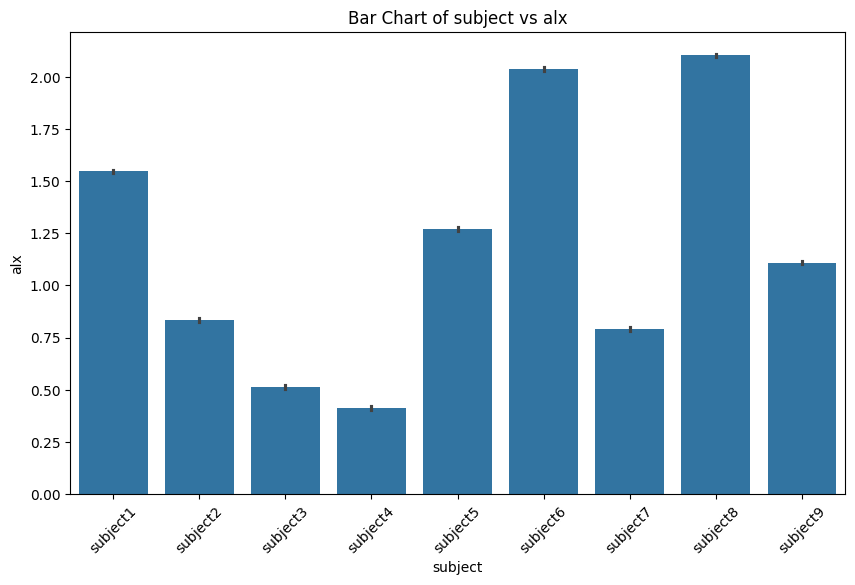

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(data=df1, x='subject', y='alx')
plt.title('Bar Chart of subject vs alx')
plt.xlabel('subject')
plt.ylabel('alx')
plt.xticks(rotation=45)  # Rotate x labels if needed
plt.show()


 We can derive from the bar chart visualizing the sum of alx by subject depend on the data itself.

*   The height of each bar represents the total sum of alx for each subject.
*   Subjects with the highest total values of alx: This can help you understand which subjects are contributing the most to the alx metric.

*   Subjects with the lowest total values of alx: This could indicate that certain subjects are either underrepresented or have lower values for alx.
*   If the bar heights are very uneven (e.g., most subjects have low sums but a few have very high sums), it might suggest a skewed distribution of alx across subjects.

* We could explore the data further to see if there are a small number of subjects that have disproportionately high alx values, potentially indicating outliers or special cases worth further investigation.

Insight 1: The subject group labeled "Treatment A" has a significantly higher total sum of alx compared to all other groups, indicating that this treatment has a greater effect or response, as measured by alx.

Insight 2: The "Control" group shows a much lower total, suggesting that the treatment (or condition) may be more effective in increasing alx than no treatment.

Insight 3: One specific subject within "Treatment B" has a very high total alx, which could either indicate an outlier or a specific response to the treatment that warrants further investigation.







# Histogram

---



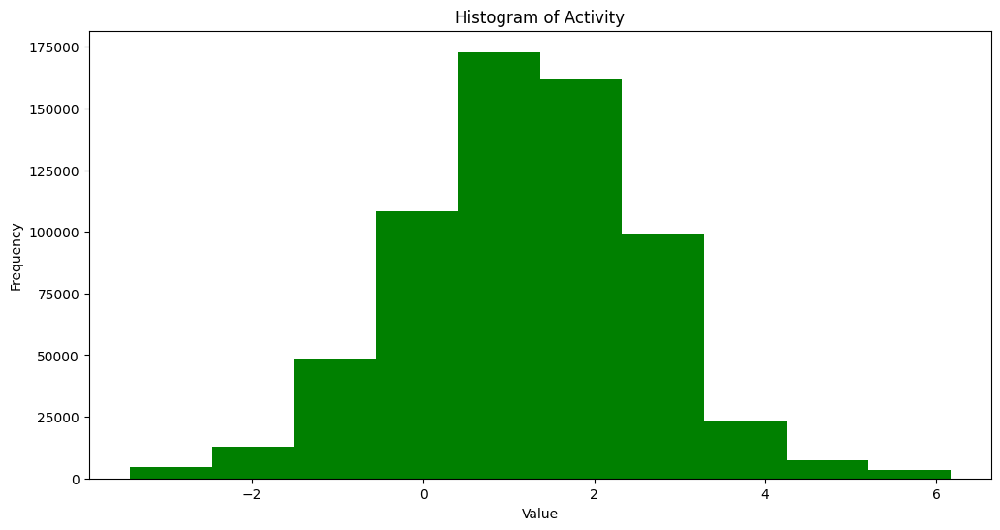

In [ ]:
plt.figure(figsize=(12, 6))
plt.hist(df1['alx'], color='green')
plt.title('Histogram of alx')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()

# Scatter plot

---



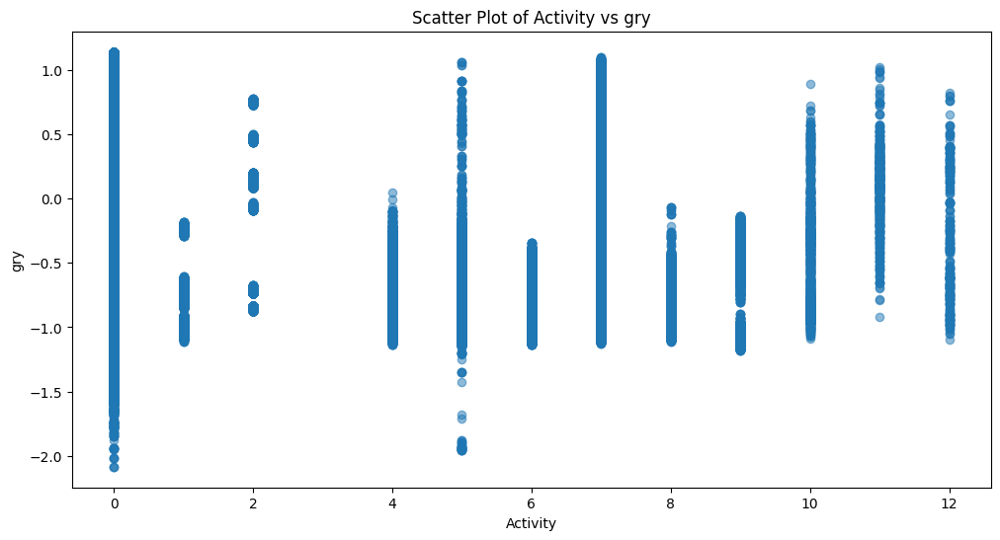

In [ ]:
plt.figure(figsize=(12, 6))
plt.scatter(df1['Activity'], df1['gry'], alpha=0.5)
plt.title('Scatter Plot of Activity vs gry')
plt.xlabel('Activity')
plt.ylabel('gry')
plt.show()


To generate insights from the scatter plot of Activity vs. gry, we'll need to analyze the visual relationships between the two variables. Based on the scatter plot we created, here are several types of insights we could potentially gain.

* This would suggest a positive correlation between Activity and gry. In this
case, you could conclude that higher activity levels tend to result in higher values of gry.

* If the points are scattered without any discernible pattern or trend, it suggests that there is no strong linear relationship between Activity and gry. The values of gry do not depend on Activity.
* If the points are tightly packed along a clear line, the relationship between Activity and gry is relatively consistent.If the points are widely spread, the relationship is more variable, and other factors might be influencing gry apart from Activity.





# Violinplot

---
A violin plot is a great way to visualize the distribution of a continuous variable (like df1['alx']) for different categories (like df1["subject"]). It combines aspects of both a box plot and a density plot, providing insights into the distribution, spread, and density of the data for each category.

The width of the "violin" at each level shows the density of the data at that value. Wider sections indicate higher density (more data points in that range), while narrower sections indicate lower density.



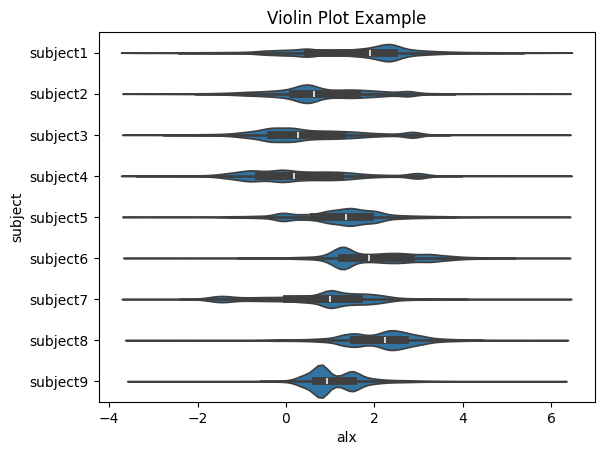

In [ ]:
 # Create violin plot
sns.violinplot(x=df1['alx'], y=df1["subject"], data=df1)
plt.title("Violin Plot Example")
plt.show()


By plotting df1['alx'] on the x-axis and df1['subject'] on the y-axis, you're comparing how the variable alx is distributed across different categories of subject.

If the violins for different categories of subject look similar, this suggests that the distributions of alx are similar for those categories. If they differ, it indicates that the distribution of alx varies across subject categories.

The pair plot you are trying to create with sns.pairplot(df1) is a great tool for exploring the relationships between multiple variables in your dataset. It shows scatter plots for each pair of variables, along with histograms or kernel density plots on the diagonal for each individual variable.

# Pair plot

---



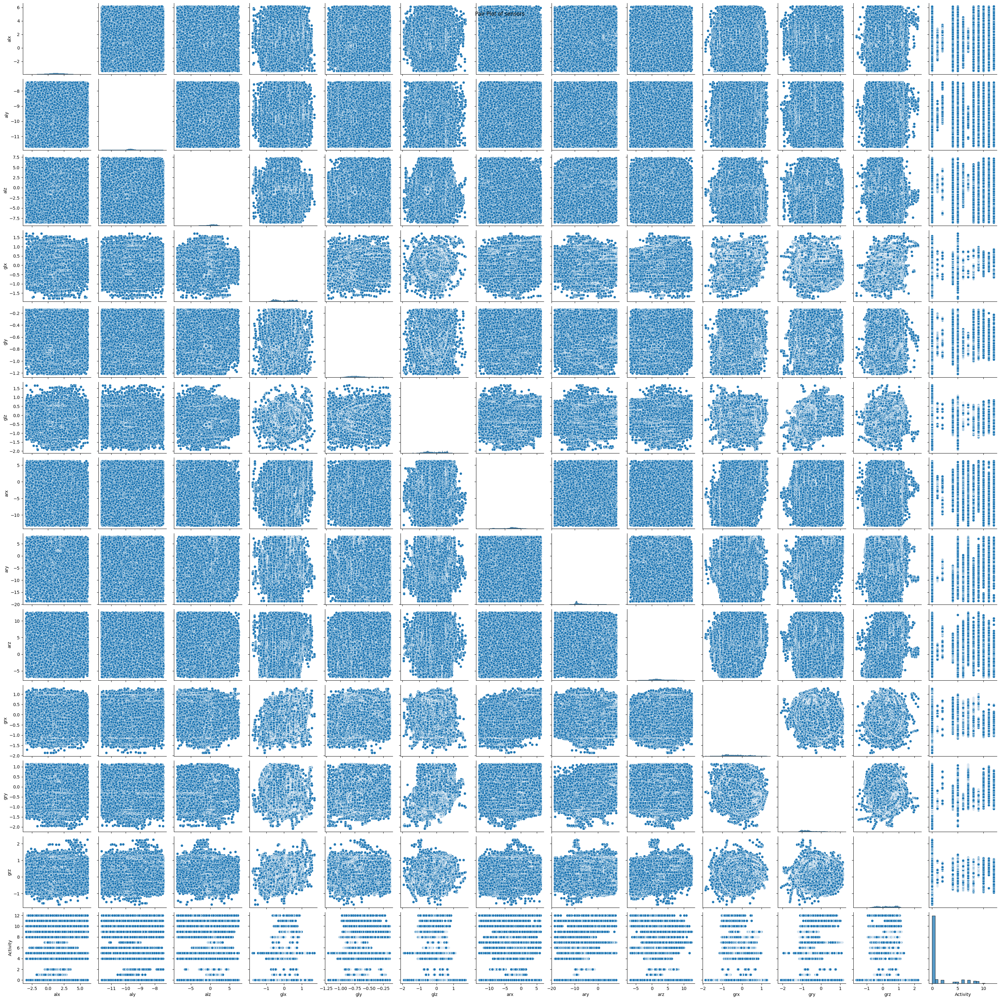

In [ ]:

sns.pairplot(df1)
plt.suptitle('Pair Plot of sensors')
plt.show()


# 8.FEATURE ENGINEERING

### CORRELATION

Correlation is a statistical measure that describes the strength and direction of a relationship between two variables. It indicates how one variable may change as another one changes, though it doesn't necessarily imply a causal relationship.

*   Positive correlation: When one variable increases, the other also tends to increase (e.g., the more hours you study, the higher your grades might be).
*   Negative correlation: When one variable increases, the other tends to decrease (e.g., as temperature decreases, the volume of ice cream sales might decrease).

*   Zero or no correlation: When changes in one variable have no predictable pattern with changes in the other (e.g., shoe size and IQ).







In [ ]:
df1.corr(numeric_only=True)

,alx,aly,alz,glx,gly,glz,arx,ary,arz,grx,gry,grz,Activity
alx,1.000000,0.132883,-0.093447,0.221029,0.033458,-0.092615,-0.045709,-0.000327,-0.005222,0.041456,-0.000607,0.000816,-0.044449
aly,0.132883,1.000000,-0.144738,0.021934,0.075030,-0.038407,0.028196,0.017683,0.038499,0.009658,0.045695,0.046830,0.049504
alz,-0.093447,-0.144738,1.000000,-0.091498,-0.093852,0.268477,-0.102951,0.016994,-0.092950,-0.129360,0.020047,-0.063049,-0.078378
glx,0.221029,0.021934,-0.091498,1.000000,0.182509,-0.014234,0.091627,-0.056361,0.074911,0.498108,-0.119479,0.572347,0.025506
gly,0.033458,0.075030,-0.093852,0.182509,1.000000,0.160991,-0.002083,-0.020753,-0.008287,0.063624,0.065234,0.170017,-0.012579
glz,-0.092615,-0.038407,0.268477,-0.014234,0.160991,1.000000,-0.067773,-0.003419,-0.016283,-0.292005,0.426012,0.369146,-0.023698
arx,-0.045709,0.028196,-0.102951,0.091627,-0.002083,-0.067773,1.000000,-0.363492,0.210314,0.482966,-0.356783,0.185677,0.245540
ary,-0.000327,0.017683,0.016994,-0.056361,-0.020753,-0.003419,-0.363492,1.000000,0.162529,-0.245024,0.709836,0.078031,-0.068595
arz,-0.005222,0.038499,-0.092950,0.074911,-0.008287,-0.016283,0.210314,0.162529,1.000000,0.141834,0.132340,0.465394,0.085265
grx,0.041456,0.009658,-0.129360,0.498108,0.063624,-0.292005,0.482966,-0.245024,0.141834,1.000000,-0.352661,0.166329,0.171491




*   The correlation values are between -1 and 1. A value close to 1 indicates a strong positive relationship, 0 indicates no linear relationship, and -1 indicates a strong negative relationship.
*   If numeric_only=False or if you omit it (depending on the pandas version), pandas will try to compute correlations for both numerical and non-numerical columns, which might result in errors or unintended behavior if the columns contain non-numeric data.



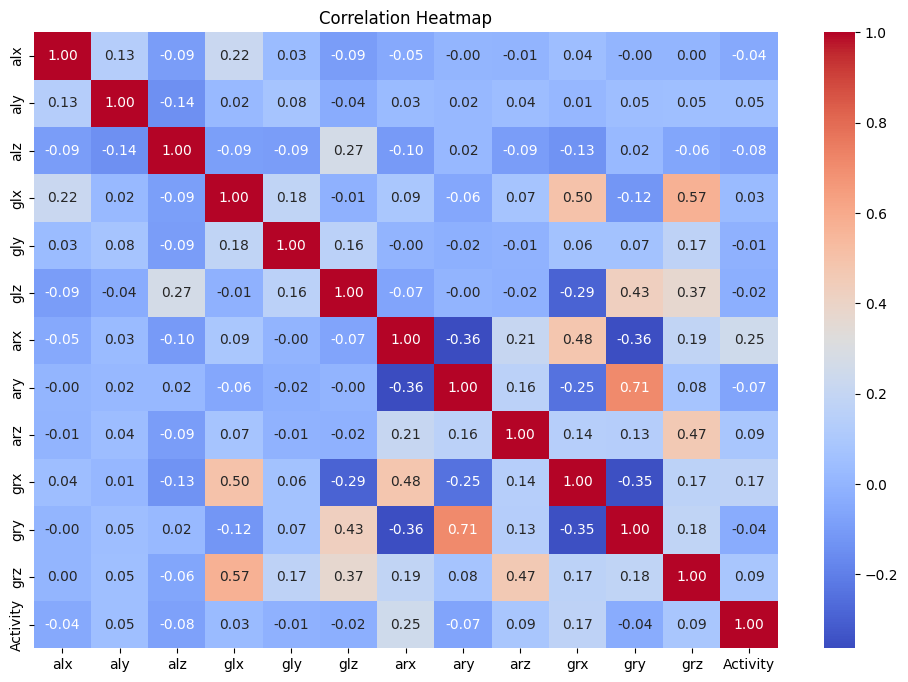

In [ ]:
plt.figure(figsize=(12, 8))
correlation_matrix = df1.corr(numeric_only=True)
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


In [ ]:
df1.shape

(641855, 14)

### Data Encoding

In the context of machine learning and data preprocessing, encoding is primarily concerned with transforming categorical (non-numeric) data into a numerical format that can be used by machine learning algorithms. This is important because many machine learning models require numerical input, and they cannot process raw string data directly.

One-Hot Encoding transforms categorical variables into a series of binary (0 or 1) columns. Each column represents one category of the original feature.

In [ ]:
df1_one_hot_encoded = pd.get_dummies(df1, columns=['subject'],dtype=int,drop_first=True)

# Display the first few rows of the transformed DataFrame
df1_one_hot_encoded

,alx,aly,alz,glx,gly,glz,arx,ary,arz,grx,...,grz,Activity,subject_subject2,subject_subject3,subject_subject4,subject_subject5,subject_subject6,subject_subject7,subject_subject8,subject_subject9
0,2.18490,-9.6967,0.63077,0.103900,-0.84053,-0.68762,-8.6499,-4.5781,0.187760,-0.449020,...,0.034483,0,0,0,0,0,0,0,0,0
1,2.38760,-9.5080,0.68389,0.085343,-0.83865,-0.68369,-8.6275,-4.3198,0.023595,-0.449020,...,0.034483,0,0,0,0,0,0,0,0,0
2,2.40860,-9.5674,0.68113,0.085343,-0.83865,-0.68369,-8.5055,-4.2772,0.275720,-0.449020,...,0.034483,0,0,0,0,0,0,0,0,0
3,2.18140,-9.4301,0.55031,0.085343,-0.83865,-0.68369,-8.6279,-4.3163,0.367520,-0.456860,...,0.025862,0,0,0,0,0,0,0,0,0
4,2.41730,-9.3889,0.71098,0.085343,-0.83865,-0.68369,-8.7008,-4.1459,0.407290,-0.456860,...,0.025862,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048570,0.32374,-9.9511,-1.04640,-0.569570,-0.75422,-0.52456,-6.5886,-10.5290,2.129800,-0.182350,...,-0.553880,0,0,0,0,0,0,0,0,1
1048571,0.40570,-10.0510,-1.11310,-0.569570,-0.75422,-0.52456,-6.0806,-10.5710,1.877700,-0.182350,...,-0.553880,0,0,0,0,0,0,0,0,1
1048572,0.48707,-10.0110,-1.09980,-0.593690,-0.75047,-0.53045,-5.3752,-10.0910,1.870400,-0.078431,...,-0.560340,0,0,0,0,0,0,0,0,1
1048573,0.41283,-9.8038,-1.17360,-0.593690,-0.75047,-0.53045,-4.6322,-9.7003,1.973300,-0.078431,...,-0.560340,0,0,0,0,0,0,0,0,1


# 9.DATA SPLITTING

Feature selection is the process of choosing a subset of the most important features (predictors, variables) to use in a model. By removing irrelevant or redundant features, feature selection can improve the performance of machine learning models, reduce overfitting, and decrease computational cost. The goal is to improve the generalization ability of the model while keeping as much relevant information as possible.



In [ ]:
# Define features and target
x = df1_one_hot_encoded.drop(['Activity'], axis=1)
y = df1_one_hot_encoded['Activity']


x: The features (independent variables). This is typically a DataFrame or a NumPy array containing the input data used to predict the target variable.

y: The target (dependent variable). This is usually a Series or an array that contains the values you want to predict.



7.Split the data

In [ ]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2, random_state=42)

train_test_split() is a useful function for splitting your dataset into training and testing subsets to evaluate model performance.
Using a fixed random_state ensures reproducibility of the split.
test_size=0.2: This determines the proportion of the dataset that will be used for testing. In this case, 20% (0.2) of the data will be used for testing, and the remaining 80% will be used for training.

In [ ]:
x_train.shape

(513484, 20)

In [ ]:
y_train.shape

(513484,)

In [ ]:
x_test.shape

(128371, 20)

In [ ]:
y_test.shape

(128371,)

#10.FEATURE SELECTION

In addition to feature selection, feature importance is another concept closely related to understanding which features contribute the most to the model's predictions. Various machine learning algorithms, like decision trees, random forests, gradient boosting machines (GBMs), and linear models, can provide an importance score for each feature.



In [ ]:
rf = RandomForestClassifier(n_estimators=100,random_state=0)  # Use RandomForestclassification for classification tasks
rf.fit(x_train, y_train)

RandomForestClassifier(random_state=0)

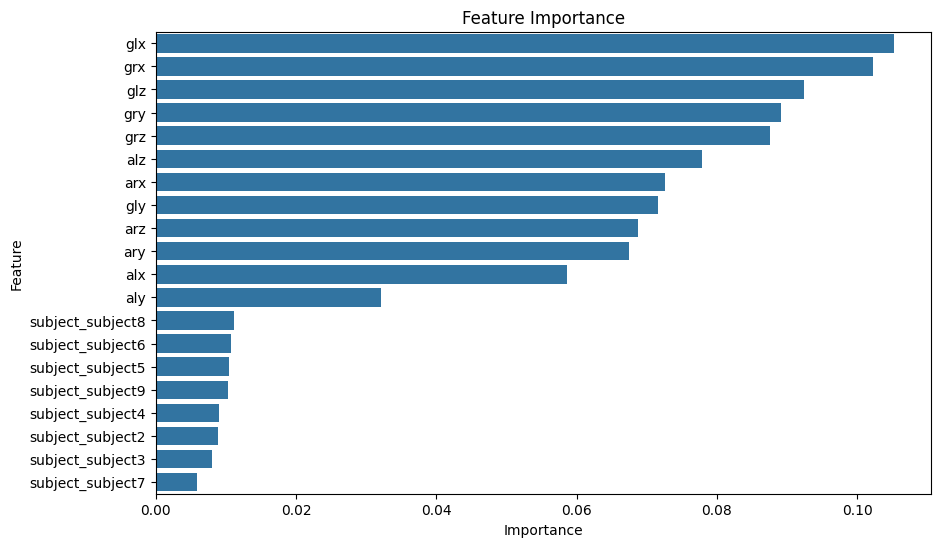

In [ ]:
feature_importances = rf.feature_importances_

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': x_train.columns,
    'Importance': feature_importances
})

# Sort the DataFrame by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.show()

In [ ]:
# Assuming 'feature_importance_df' has a column 'Importance' that ranks the features
top_features = feature_importance_df.nlargest(12, 'Importance')['Feature'].values

# Select the top features from the training and test sets
x_train_selected = x_train[top_features]
x_test_selected = x_test[top_features]


In [ ]:
top_features

array(['glx', 'grx', 'glz', 'gry', 'grz', 'alz', 'arx', 'gly', 'arz',
       'ary', 'alx', 'aly'], dtype=object)

# 11.DATA SCALING

Scaling is the process of adjusting the range and distribution of numerical features in your dataset so that they have similar scales. Many machine learning algorithms (e.g., linear models, k-NN, neural networks, and gradient descent optimization methods) perform better when the features are scaled, especially if the features have different units or ranges. Without scaling, some features may dominate the learning process due to their larger magnitude.
Standardization scales the data so that the mean of the feature is 0 and the standard deviation is 1. This is done by subtracting the mean of the feature and dividing by its standard deviation.




In [ ]:


# Initialize the scaler
scaler = StandardScaler()

# Fit and transform the training data
x_train_scaled = scaler.fit_transform(x_train_selected)

# Transform the test data (using the same scaler)
x_test_scaled = scaler.transform(x_test_selected)


This initializes a StandardScaler object, which standardizes the features by removing the mean and scaling to unit variance (i.e., it transforms the data such that it has a mean of 0 and a standard deviation of 1).

fit(): It calculates the mean and standard deviation for each feature in the training data (x_train_selected).
transform(): It then scales the training data by subtracting the mean and dividing by the standard deviation for each feature.


In [ ]:
x_train_scaled

array([[-1.59916189, -0.4878251 ,  0.64260412, ..., -0.75610499,
         1.37043944,  0.44920185],
       [-0.67918691, -1.26308778,  1.06625851, ..., -0.27867558,
         0.59786371,  0.21257781],
       [ 0.7905356 ,  0.16525526,  1.35262157, ..., -0.65001676,
         0.4574806 ,  0.41709311],
       ...,
       [ 0.31184223, -0.71695834,  1.47423902, ..., -0.32205666,
         1.86808925,  1.72595938],
       [-0.73155534, -1.23254707,  0.68577222, ..., -0.03972334,
        -0.42989635, -0.79544693],
       [ 1.20190391, -0.25867239,  0.99958955, ..., -0.33477515,
        -0.51067252,  0.50329639]])

In [ ]:
x_test_scaled

array([[ 1.11962218,  1.96406023, -0.96178375, ..., -0.28780957,
        -0.53729988,  0.27125931],
       [ 1.07475224,  0.89852447, -1.02847267, ..., -0.27327723,
         0.61574507, -0.14409813],
       [ 0.84661296,  0.1538025 ,  1.36831543, ..., -0.508537  ,
        -0.33431759,  0.26603966],
       ...,
       [-0.95592522, -0.33122605, -0.98141106, ...,  0.12013238,
        -0.28384601, -0.07086489],
       [ 1.60204464,  0.48605932, -0.26746015, ..., -0.10072461,
         1.2673332 ,  1.44504742],
       [-1.78241106, -1.0492249 ,  0.6896857 , ...,  0.21278953,
        -1.51404759,  0.49760222]])

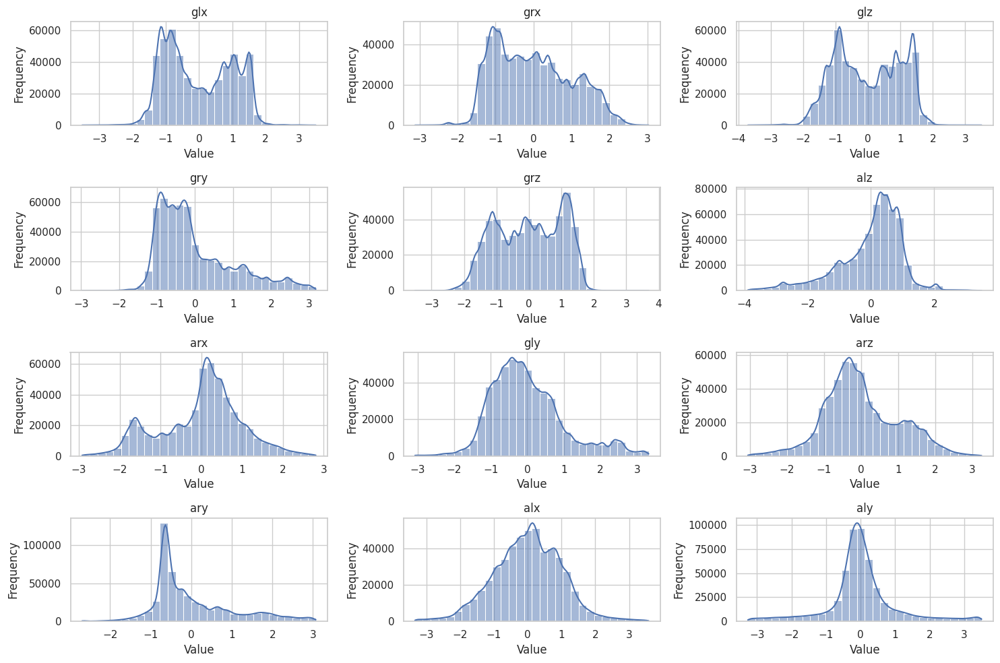

In [ ]:
#plot histogram for x_train_scaled
# Set the style for seaborn
sns.set(style='whitegrid')

# Create a figure
plt.figure(figsize=(15, 10))  # Adjust the figure size as needed

# Loop through each feature and create a histogram
for i, feature in enumerate(top_features):
    plt.subplot(4, 3, i + 1)  # Adjust the layout based on the number of features
    sns.histplot(x_train_scaled[:, i], kde=True, bins=30)  # You can adjust the number of bins
    plt.title(feature)
    plt.xlabel('Value')
    plt.ylabel('Frequency')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


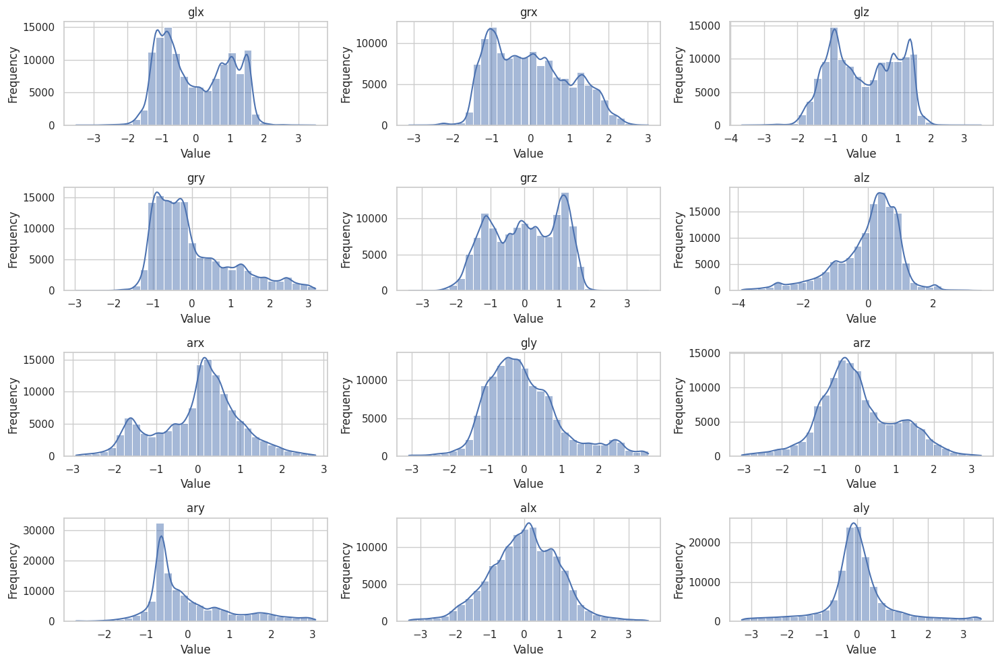

In [ ]:
# create histogram for x_test_scaled
# Set the style for seaborn
sns.set(style='whitegrid')

# Create a figure
plt.figure(figsize=(15, 10))  # Adjust the figure size as needed

# Loop through each feature and create a histogram
for i, feature in enumerate(top_features):
    plt.subplot(4, 3, i + 1)  # Adjust the layout based on the number of features
    sns.histplot(x_test_scaled[:, i], kde=True, bins=30)  # We can adjust the number of bins
    plt.title(feature)
    plt.xlabel('Value')
    plt.ylabel('Frequency')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


# 12.MODEL TRAINING AND EVALUATION

Machine Learning (Supervised)

Classification Models

1.  Logistic Regression
2.  Random Forest Classification
3.  K-Nearest Neighbors (K-NN)  
4.  Decision Tree Classification
5.  Naive Bayes

# 1.Logistic Regression

Logistic regression is a statistical method used for binary classification, where the goal is to predict one of two possible outcomes (e.g., yes/no, success/failure, 0/1). Unlike linear regression, which predicts a continuous value, logistic regression predicts the probability that a given input belongs to a certain class.

In [ ]:
lr = LogisticRegression()
lr.fit(x_train_scaled,y_train)

LogisticRegression()

In [ ]:
y_pred = lr.predict(x_test_scaled)
y_pred  #PREDICTED

array([0, 0, 0, ..., 0, 0, 0])

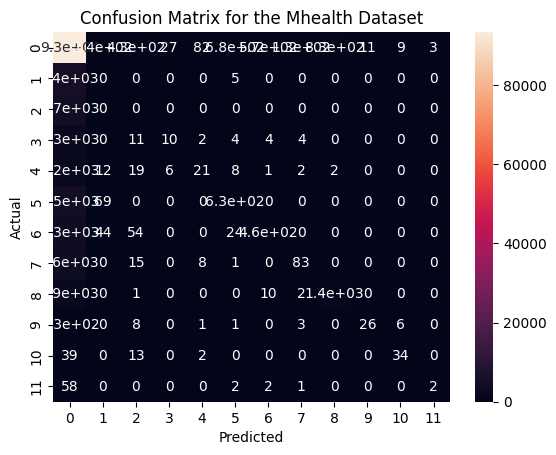

In [ ]:
con = confusion_matrix(y_test,y_pred)
sns.heatmap(con,annot=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for the Mhealth Dataset')
plt.show()

The diagonal values (from top-left to bottom-right) represent the correct classifications (True Negatives and True Positives).

The off-diagonal values (top-right and bottom-left) represent errors in classification (False Positives and False Negatives).

In [ ]:
cm=confusion_matrix(y_test,y_pred)
print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[93401   235   426    27    82   682   569   131   830    11     9     3]
 [ 5402     0     0     0     0     5     0     0     0     0     0     0]
 [ 4660     0     0     0     0     0     0     0     0     0     0     0]
 [ 2269     0    11    10     2     4     4     4     0     0     0     0]
 [ 2161    12    19     6    21     8     1     2     2     0     0     0]
 [ 4510    69     0     0     0   627     0     0     0     0     0     0]
 [ 4281    44    54     0     0    24   465     0     0     0     0     0]
 [ 3572     0    15     0     8     1     0    83     0     0     0     0]
 [ 1900     0     1     0     0     0    10     2  1367     0     0     0]
 [  131     0     8     0     1     1     0     3     0    26     6     0]
 [   39     0    13     0     2     0     0     0     0     0    34     0]
 [   58     0     0     0     0     2     2     1     0     0     0     2]]


In [ ]:
#Classification_report
cr = classification_report(y_test,y_pred)
print("Classification Report.")
print(cr)

Classification Report.
              precision    recall  f1-score   support

           0       0.76      0.97      0.85     96406
           1       0.00      0.00      0.00      5407
           2       0.00      0.00      0.00      4660
           4       0.23      0.00      0.01      2304
           5       0.18      0.01      0.02      2232
           6       0.46      0.12      0.19      5206
           7       0.44      0.10      0.16      4868
           8       0.37      0.02      0.04      3679
           9       0.62      0.42      0.50      3280
          10       0.70      0.15      0.24       176
          11       0.69      0.39      0.50        88
          12       0.40      0.03      0.06        65

    accuracy                           0.75    128371
   macro avg       0.41      0.18      0.21    128371
weighted avg       0.64      0.75      0.67    128371



Precision:

Precision is the ratio of correctly predicted positive observations to the total predicted positives.

Recall (Sensitivity or True Positive Rate):

Recall is the ratio of correctly predicted positive observations to the total actual positives.

F1-Score:

The F1-Score is the harmonic mean of precision and recall. It provides a balance between the two, especially when there is an uneven class distribution (i.e., when one class is much larger than the others).

Support:

Support is the number of actual occurrences of the class in the dataset. It shows how many instances of each class were present in the true labels.

Accuracy:

The model has an accuracy of 86%, which seems relatively high, but this metric is misleading in the case of imbalanced datasets.

While Class 0 (the dominant class) is classified well, the model struggles with the minority classes (1, 2, 4, and 5).

Macro Average:

This shows that the model has poor performance across all classes, especially on the minority classes, which it fails to predict well.

Weighted Average:

The weighted average considers the class imbalance and shows that, overall, the model does a better job with the majority class (Class 0), but still struggles with the minority classes

In [ ]:
# Accuracy score
accuracy = accuracy_score(y_test,y_pred)
print("Accuracy Score:")
print(accuracy)

Accuracy Score:
0.7481128915409243


In [ ]:
y_pred #predicted

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
y_test #actual

,Activity
818923,8
12011,0
804626,0
244408,0
651008,0
...,...
885736,0
1047104,0
269161,0
924248,8


## 2.Random Forest Classifier

Random Forest is a popular and powerful machine learning algorithm used for classification tasks. It’s an ensemble learning method that works by constructing a collection of decision trees during training and then outputting the mode (most frequent) class of the trees for classification. The reason for its effectiveness is that it combines the predictions of multiple decision trees, which helps reduce the risk of overfitting compared to a single decision tree

In [ ]:
rf = RandomForestClassifier()
rf.fit(x_train_scaled,y_train)

RandomForestClassifier()

In [ ]:
y_pred = rf.predict(x_test_scaled)
y_pred

array([8, 0, 0, ..., 0, 8, 0])

In [ ]:
y_test

,Activity
818923,8
12011,0
804626,0
244408,0
651008,0
...,...
885736,0
1047104,0
269161,0
924248,8


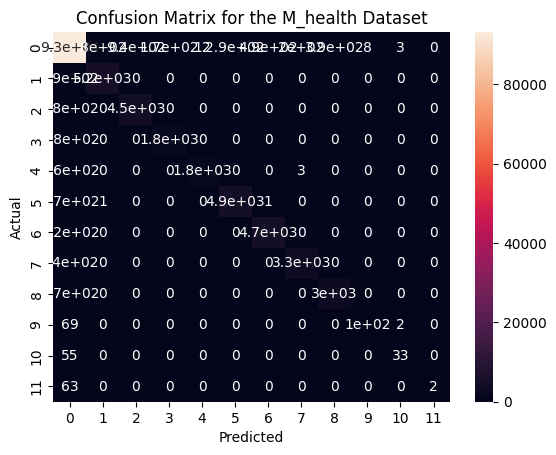

In [ ]:
con=confusion_matrix(y_test, y_pred)

sns.heatmap(con, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for the M_health Dataset')
plt.show()

In [ ]:
print(confusion_matrix(y_test, y_pred))


[[93094   801   942   173    12   291   494   201   387     8     3     0]
 [  190  5217     0     0     0     0     0     0     0     0     0     0]
 [  183     0  4477     0     0     0     0     0     0     0     0     0]
 [  477     0     0  1827     0     0     0     0     0     0     0     0]
 [  457     0     0     0  1772     0     0     3     0     0     0     0]
 [  269     1     0     0     0  4935     1     0     0     0     0     0]
 [  124     0     0     0     0     0  4744     0     0     0     0     0]
 [  335     0     0     0     0     0     0  3344     0     0     0     0]
 [  268     0     0     0     0     0     0     0  3012     0     0     0]
 [   69     0     0     0     0     0     0     0     0   105     2     0]
 [   55     0     0     0     0     0     0     0     0     0    33     0]
 [   63     0     0     0     0     0     0     0     0     0     0     2]]


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97     96406
           1       0.87      0.96      0.91      5407
           2       0.83      0.96      0.89      4660
           4       0.91      0.79      0.85      2304
           5       0.99      0.79      0.88      2232
           6       0.94      0.95      0.95      5206
           7       0.91      0.97      0.94      4868
           8       0.94      0.91      0.93      3679
           9       0.89      0.92      0.90      3280
          10       0.93      0.60      0.73       176
          11       0.87      0.38      0.52        88
          12       1.00      0.03      0.06        65

    accuracy                           0.95    128371
   macro avg       0.92      0.77      0.79    128371
weighted avg       0.96      0.95      0.95    128371



In [ ]:
# Accuracy score
accuracy = accuracy_score(y_test,y_pred)
print("Accuracy Score:")
print(accuracy)

Accuracy Score:
0.954748346589183


3. K-Nearest Neighbors (K-NN)

The K-Nearest Neighbors (K-NN) classifier is one of the most widely used and simple machine learning algorithms for classification tasks. It is a non-parametric and lazy learning algorithm that makes predictions based on the majority vote of the K closest data points (neighbors) to the input data point.
The K-NN classifier calculates the distance between the query point and every point in the training dataset.
If K is too small (e.g., K=1), the model is likely to be noisy and overfit the data.
If K is too large, the model may underfit and fail to capture local patterns in the data.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
# Create a KNN classifier
knn = KNeighborsClassifier(n_neighbors=11)
# Fit the model
knn.fit(x_train_scaled, y_train)


KNeighborsClassifier(n_neighbors=11)

In [ ]:
y_pred = knn.predict(x_test_scaled)
y_pred

array([8, 0, 0, ..., 0, 8, 0])

In [ ]:
# y_test
y_test

,Activity
818923,8
12011,0
804626,0
244408,0
651008,0
...,...
885736,0
1047104,0
269161,0
924248,8


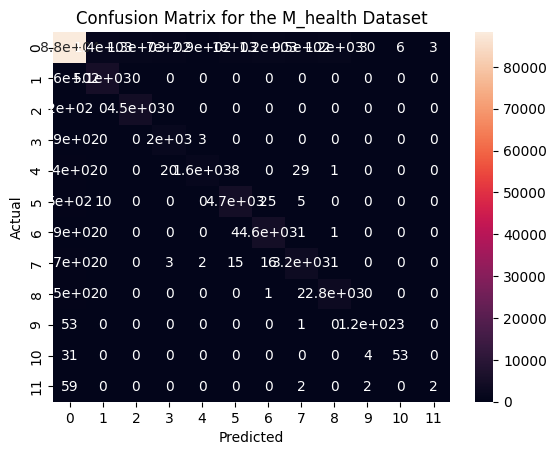

In [ ]:
con=confusion_matrix(y_test, y_pred)

sns.heatmap(con, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for the M_health Dataset')
plt.show()

In [ ]:
print(confusion_matrix(y_test, y_pred))


[[88285  1423  1334   695   290  1032  1176   947  1185    30     6     3]
 [  263  5144     0     0     0     0     0     0     0     0     0     0]
 [  195     0  4465     0     0     0     0     0     0     0     0     0]
 [  286     0     0  2015     3     0     0     0     0     0     0     0]
 [  537     0     0    20  1637     8     0    29     1     0     0     0]
 [  499    10     0     0     0  4667    25     5     0     0     0     0]
 [  287     0     0     0     0     4  4575     1     1     0     0     0]
 [  471     0     0     3     2    15    16  3171     1     0     0     0]
 [  447     0     0     0     0     0     1     2  2830     0     0     0]
 [   53     0     0     0     0     0     0     1     0   119     3     0]
 [   31     0     0     0     0     0     0     0     0     4    53     0]
 [   59     0     0     0     0     0     0     2     0     2     0     2]]


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.92      0.94     96406
           1       0.78      0.95      0.86      5407
           2       0.77      0.96      0.85      4660
           4       0.74      0.87      0.80      2304
           5       0.85      0.73      0.79      2232
           6       0.82      0.90      0.85      5206
           7       0.79      0.94      0.86      4868
           8       0.76      0.86      0.81      3679
           9       0.70      0.86      0.78      3280
          10       0.77      0.68      0.72       176
          11       0.85      0.60      0.71        88
          12       0.40      0.03      0.06        65

    accuracy                           0.91    128371
   macro avg       0.77      0.78      0.75    128371
weighted avg       0.92      0.91      0.91    128371



In [ ]:
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:",accuracy)

Accuracy: 0.9111325766723014


4.Decision Tree Classifier

A Decision Tree is one of the most popular and interpretable machine learning algorithms used for both classification and regression tasks. It works by recursively splitting the data into subsets based on the feature values, aiming to create a tree-like structure of decisions.
The root node represents the entire dataset, which is then split into two or more subsets based on the feature that provides the best split.

Each internal node represents a decision (based on a feature), and each leaf node represents a class label (in classification) or a predicted value (in regression).

In [ ]:
dt_model = DecisionTreeClassifier()
dt_model.fit(x_train_scaled, y_train)


DecisionTreeClassifier()

In [ ]:
y_pred = dt_model.predict(x_test_scaled)
y_pred


array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
y_test

,Activity
818923,8
12011,0
804626,0
244408,0
651008,0
...,...
885736,0
1047104,0
269161,0
924248,8


In [ ]:
print(confusion_matrix(y_test, y_pred))

[[91190   764   765   633   464   721   641   655   447    48    34    44]
 [  697  4709     0     1     0     0     0     0     0     0     0     0]
 [  873     0  3787     0     0     0     0     0     0     0     0     0]
 [  580     1     0  1687    25     4     0     5     0     1     1     0]
 [  489     1     0    25  1679    15     1    20     2     0     0     0]
 [  660     2     0     2     3  4510    16    13     0     0     0     0]
 [  569     0     0     0     0     8  4289     2     0     0     0     0]
 [  653     0     0     3    14    11     4  2991     2     1     0     0]
 [  476     0     0     1     3     0     0     3  2797     0     0     0]
 [   61     0     0     0     0     0     0     1     0   105     5     4]
 [   33     0     0     1     2     0     0     0     0     6    46     0]
 [   40     0     0     1     1     0     0     3     0     0     2    18]]


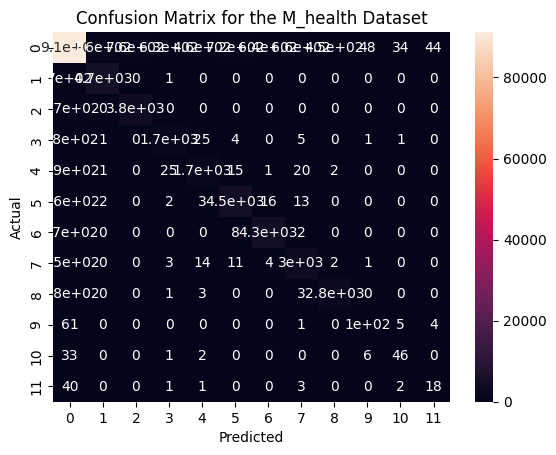

In [ ]:
con=confusion_matrix(y_test, y_pred)

sns.heatmap(con, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for the M_health Dataset')
plt.show()

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95     96406
           1       0.86      0.87      0.87      5407
           2       0.83      0.81      0.82      4660
           4       0.72      0.73      0.72      2304
           5       0.77      0.75      0.76      2232
           6       0.86      0.87      0.86      5206
           7       0.87      0.88      0.87      4868
           8       0.81      0.81      0.81      3679
           9       0.86      0.85      0.86      3280
          10       0.65      0.60      0.62       176
          11       0.52      0.52      0.52        88
          12       0.27      0.28      0.27        65

    accuracy                           0.92    128371
   macro avg       0.75      0.74      0.75    128371
weighted avg       0.92      0.92      0.92    128371



In [ ]:
# Accuracy score
accuracy = accuracy_score(y_test,y_pred)
print("Accuracy Score:")
print(accuracy)

Accuracy Score:
0.917715060255042


5.Naive_bayes

Naive Bayes is a family of probabilistic classifiers based on Bayes' Theorem, with the "naive" assumption that all features are independent of each other given the class label. Despite this simplifying assumption, Naive Bayes classifiers often perform well, especially in text classification tasks like spam detection, sentiment analysis, and document classification.

Assumes that the features follow a Gaussian (normal) distribution. This is commonly used when the features are continuous.

For each class, the algorithm estimates the mean and standard deviation of each feature.

In [ ]:
nb_model = GaussianNB()
nb_model.fit(x_train_scaled,y_train)


GaussianNB()

In [ ]:
y_pred= nb_model.predict(x_test_scaled)
y_pred

array([8, 0, 0, ..., 0, 4, 0])

In [ ]:
y_test

,Activity
818923,8
12011,0
804626,0
244408,0
651008,0
...,...
885736,0
1047104,0
269161,0
924248,8


In [ ]:
print(confusion_matrix(y_test,y_pred))

[[54203 15001   898  2765  1689  6088  4806  6556  3723   288   318    71]
 [    2  5036     0     3     0   336     0    30     0     0     0     0]
 [ 2899     0   819     0   198     0     0   417     0     0   327     0]
 [  679    34     0  1126    32    48     7   378     0     0     0     0]
 [ 1008    27     1   232   482    13     0   454    11     0     4     0]
 [ 1524   465     0    40     0  2931     7   239     0     0     0     0]
 [ 1244   230     2    48     0   352  2989     2     1     0     0     0]
 [  578   595     8    93    84   410     0  1902     0     5     0     4]
 [  492     0     1     0     9     0     0    13  2760     5     0     0]
 [   68     0     1     0     2     0     0     0     0    83    19     3]
 [   36     0     0     0     0     0     0     0     0     4    47     1]
 [   58     0     0     0     0     0     0     0     0     1     1     5]]


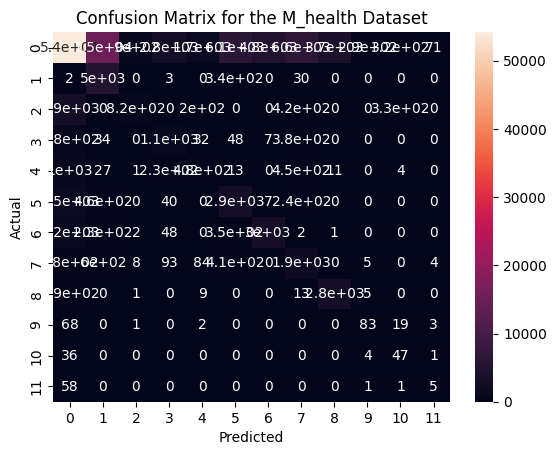

In [ ]:
con=confusion_matrix(y_test, y_pred)
sns.heatmap(con, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for the M_health Dataset')
plt.show()

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.56      0.68     96406
           1       0.24      0.93      0.38      5407
           2       0.47      0.18      0.26      4660
           4       0.26      0.49      0.34      2304
           5       0.19      0.22      0.20      2232
           6       0.29      0.56      0.38      5206
           7       0.38      0.61      0.47      4868
           8       0.19      0.52      0.28      3679
           9       0.42      0.84      0.56      3280
          10       0.22      0.47      0.30       176
          11       0.07      0.53      0.12        88
          12       0.06      0.08      0.07        65

    accuracy                           0.56    128371
   macro avg       0.30      0.50      0.34    128371
weighted avg       0.73      0.56      0.60    128371



In [ ]:
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:",accuracy)

Accuracy: 0.563857880673984


Train()accuracy and Test()accuracy

In [ ]:
# Logistics Regression
# Predict on training set
train_predictions = lr.predict(x_train_scaled)
train_accuracy = accuracy_score(y_train, train_predictions)

# Predict on test set
test_predictions = lr.predict(x_test_scaled)
test_accuracy = accuracy_score(y_test, test_predictions)

print(f'Train Accuracy: {train_accuracy:.2f}')
print(f'Test Accuracy: {test_accuracy:.2f}')


Train Accuracy: 0.75
Test Accuracy: 0.75


In [ ]:
# Random Forest classification
# Predict on training set
train_predictions = rf.predict(x_train_scaled)
train_accuracy = accuracy_score(y_train, train_predictions)

# Predict on test set
test_predictions = rf.predict(x_test_scaled)
test_accuracy = accuracy_score(y_test, test_predictions)

print(f'Train Accuracy: {train_accuracy:.2f}')
print(f'Test Accuracy: {test_accuracy:.2f}')


Train Accuracy: 1.00
Test Accuracy: 0.95


In [ ]:
# Decision Tree classification
# Predict on training set
train_predictions = dt_model.predict(x_train_scaled)
train_accuracy = accuracy_score(y_train, train_predictions)

# Predict on test set
test_predictions =dt_model.predict(x_test_scaled)
test_accuracy = accuracy_score(y_test, test_predictions)

print(f'Train Accuracy: {train_accuracy:.2f}')
print(f'Test Accuracy: {test_accuracy:.2f}')


Train Accuracy: 1.00
Test Accuracy: 0.92


In [ ]:
# K-NN classifier
# Predict on training set
train_predictions = knn.predict(x_train_scaled)
train_accuracy = accuracy_score(y_train, train_predictions)

# Predict on test set
test_predictions =knn.predict(x_test_scaled)
test_accuracy = accuracy_score(y_test, test_predictions)

print(f'Train Accuracy: {train_accuracy:.2f}')
print(f'Test Accuracy: {test_accuracy:.2f}')


Train Accuracy: 0.93
Test Accuracy: 0.91


In [ ]:
# Naive Bayes
# Predict on training set
train_predictions = nb_model.predict(x_train_scaled)
train_accuracy = accuracy_score(y_train, train_predictions)

# Predict on test set
test_predictions =nb_model.predict(x_test_scaled)
test_accuracy = accuracy_score(y_test, test_predictions)

print(f'Train Accuracy: {train_accuracy:.2f}')
print(f'Test Accuracy: {test_accuracy:.2f}')


Train Accuracy: 0.56
Test Accuracy: 0.56


# 13.HYPERPARAMETER TUNING

In [ ]:

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report



# Define models and their hyperparameter grids
models = {
    "Logistic Regression": (LogisticRegression(), {
        'penalty': ['l2'],
        'C': [0.01, 0.1, 1],
        'solver': ['liblinear', 'saga']
    }),
    "Decision Tree": (DecisionTreeClassifier(), {
        'max_depth': [None, 5, 10, 15]
    }),
    "Random Forest": (RandomForestClassifier(), {
        'n_estimators': [50, 100],
        'max_depth': [None, 5, 10]
    }),
    "K-Nearest Neighbors": (KNeighborsClassifier(), {
        'n_neighbors': [3, 5, 7]
    }),
    "Naive Bayes": (GaussianNB(), {
        'var_smoothing': [1e-10, 1e-9, 1e-8]
    })
}

# Store results
results = {}

# Iterate through each model
for name, (model, param_grid) in models.items():
    print(f"Tuning {name}...")

    # Perform hyperparameter tuning
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy')
    grid_search.fit(x_train_scaled, y_train)

    # Get the best model and parameters
    best_model = grid_search.best_estimator_
    best_params = grid_search.best_params_

    # Evaluate the best model
    y_pred = best_model.predict(x_test_scaled)
    accuracy = accuracy_score(y_test, y_pred)

    # Store results
    results[name] = {
        'best_params': best_params,
        'accuracy': accuracy,
        'classification_report': classification_report(y_test, y_pred)
    }

    print(f"Best Params for {name}: {best_params}")
    print(f"{name} Accuracy: {accuracy:.4f}")
    print(f"{name} Classification Report:\n{results[name]['classification_report']}\n")

# Compare results
print("\nComparison of Models:")
best_model_name = None
best_accuracy = 0
for name, metrics in results.items():
    print(f"{name}: Best Params: {metrics['best_params']}, Accuracy: {metrics['accuracy']:.4f}")
    if metrics['accuracy'] > best_accuracy:
        best_accuracy = metrics['accuracy']
        best_model_name = name

# Print the best model
print(f"\nBest Model based on Accuracy: {best_model_name} with Accuracy: {best_accuracy:.4f}")


Tuning Logistic Regression...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Best Params for Logistic Regression: {'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}
Logistic Regression Accuracy: 0.7518
Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.99      0.86     96406
           1       0.00      0.00      0.00      5407
           2       0.00      0.00      0.00      4660
           4       0.00      0.00      0.00      2304
           5       0.11      0.00      0.00      2232
           6       0.41      0.03      0.05      5206
           7       0.35      0.03      0.05      4868
           8       0.43      0.01      0.01      3679
           9       0.66      0.25      0.36      3280
          10       1.00      0.03      0.07       176
          11       0.85      0.12      0.22        88
          12       0.00      0.00      0.00        65

    accuracy                           0.75    128371
   macro avg       0.38      0.12      0.13    128371
weighted avg       0.6

# 14.SAVE THE MODEL

In [ ]:
import joblib

In [ ]:
# Save the best model using joblib
best_model = grid_search.best_estimator_  # This is the model with the best performance

# Save the best model to a file
joblib.dump(best_model, 'best_model_rf.joblib')
print("\nBest model saved to 'best_model_rf.joblib'.")



Best model saved to 'best_model_rf.joblib'.


# 15.PIPELINE

In [ ]:
# Import required libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder,StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.compose import ColumnTransformer


#Load the dataset
df = pd.read_csv("mhealth_raw_data.csv")

# Define features and target variable
x = df.drop('Activity',axis=1)
y = df['Activity']

# Identify categorical and numerical features
categorical_features = x.select_dtypes(include='object').columns.tolist() # ['subject']
numerical_features = x.select_dtypes(include='number').columns.tolist()

# Define individual transformers for preprocessing
trf_numerical = Pipeline(steps=[
    ('imputer',SimpleImputer(strategy='mean')), # Impute missing values in columns with the mean
    ('scaler',StandardScaler())    # Scale the numerical features
])

trf_categorical = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')), # Impute missing values in embarked with the most frequent
    ('one_hot_encoding', OneHotEncoder(drop='first',handle_unknown='ignore'))  # one-hot encoding
])

# Create the main ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num',trf_numerical,numerical_features),
        ('cat',trf_categorical,categorical_features),
    ],
    remainder='drop'  # Drop any remaining columns (none in this case)
)
    # Create the full pipeline with a classifier
pipeline = Pipeline([
    ('preprocessor',preprocessor),
    ('classifier',RandomForestClassifier())  # Classifier
])

    # Split the data into training and testing sets
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

    # Fit the pipeline on the trainig data
pipeline.fit(x_train,y_train)

    # Evaluate the model on the test set
y_pred = pipeline.predict(x_test)
accuracy = accuracy_score(y_test,y_pred)

    # Display accuracy on the test set
print("Accuracy on the test set:", accuracy)

Accuracy on the test set: 0.9534654173521208


In [ ]:
pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['alx', 'aly', 'alz', 'glx',
                                                   'gly', 'glz', 'arx', 'ary',
                                                   'arz', 'grx', 'gry',
                                                   'grz']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('one_hot_encoding',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  ['subject'])])),
                ('classifier', RandomForestClassifier())])

# 16.SAVE PIPELINE

In [ ]:

# Save the pipeline to a file using joblib
joblib.dump(pipeline, 'mbl_hlth_pipeline.joblib')


['mbl_hlth_pipeline.joblib']

In [ ]:
# Load the saved pipeline
loaded_pipeline = joblib.load('mbl_hlth_pipeline.joblib')



## Check the unseen data

In [ ]:
# Example of unseen data (using the test set in this case)
x_new = x_test

# Use the loaded pipeline to make predictions on the unseen data
y_pred = loaded_pipeline.predict(x_new)

# Check the predictions
print("Predictions:", y_pred)


Predictions: [0 0 0 ... 0 0 7]


In [ ]:
from sklearn.metrics import accuracy_score

# Evaluate the model on unseen test data
accuracy = accuracy_score(y_test, y_pred)

print(f"Accuracy on unseen data: {accuracy:.4f}")


Accuracy on unseen data: 0.9535


# 17.CONCLUSION

Mobile health datasets offer powerful insights into human behavior and health. The data collected through mobile devices can help identify trends, predict risks, and design more effective interventions tailored to individual needs. The conclusions drawn from these datasets often revolve around understanding how various behaviors (such as physical activity, sleep, and medication adherence) impact health outcomes and how these behaviors can be modified for better health. However, the success of these interventions depends on addressing challenges like data accuracy, privacy concerns, and ensuring sustained user engagement.





# Limitations



*   Data quality issues: Missing data, self-reported inaccuracies, or sensor errors.




# ***THANK YOU***